NMFk analysis: Geothermal data of Brady site, NV
---

This analysis demonstrates how **NMFk** can be applied to perform unsupervised machine-learning analysis.

The code below demonstrates the ML work for a submitted reseasrch paper analyzing geothermal data of Brady site, NV

## Import required Julia modules

If **NMFk** is not installed, first execute `import Pkg; Pkg.add("NMFk"); Pkg.add("DelimitedFiles"); Pkg.add("Gadfly"); Pkg.add("Mads")`.


In [7]:
import NMFk
import DelimitedFiles
import Gadfly
import Cairo
import Fontconfig
import Mads

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-6799087438035762483\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-2130775432841152515\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-6799087438035762483\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

┌ Info: Installing pyqt package to avoid buggy tkagg backend.
└ @ PyPlot /Users/vvv/.julia/packages/PyPlot/XHEG0/src/init.jl:118


## Read Brady dataset

### Setup the working directory containing Brady date

In [8]:
cd("/Users/vvv/Julia/GTcloud-SmartTensors.jl/Brady")

### Load the datafile

In [10]:
d, h = DelimitedFiles.readdlm("data/AllBradyWells_LANL_ML_9.txt", ','; header=true);

### Populate the missing wellnames

In [11]:
global wellname = ""
for i = 1:size(d, 1)
	if d[i, 1] != ""
		global wellname = d[i, 1]
	else
		d[i, 1] = wellname
	end
end

### Set missing entries to be equal to zero

In [14]:
d[d[:, 24] .== "", 24] .= 0;

In [ ]:
## Set up depth, casename, # of NMFk runs, and attributes

### Define names of the data attributes (matrix columns; short names used for coding; long names used for plotting and visualization)

In [15]:
attributes_short = ["ID", "D", "azimuth", "incline", "x", "y", "z", "casing", "fluids", "use", "production", "use2", "lt750mstatus", "normal", "coulomb", "dilation", "faults", "td", "ts", "curve", "modeltemp", "faultdense", "faultintdense", "inv_distcontacts", "inv_distfaults", "unitthickness", "goodlith", "confidence"]
attributes_long = ["ID", "Depth", "Azimuth", "Inclination", "X", "Y", "Z", "Casing", "Fluids", "use", "Production", "use2", "Status", "Normal stress", "Coulomb shear stress", "Dilation", "Faulting", "Fault dilation tendency", "Fault slip tendency", "Fault curvature", "Temperature", "Fault density", "Fault intersection density", "Inverse distance from contacts", "Inverse distance from faults", "Unit thickness", "Lithology", "Confidence"];

### Define the attributes that will be processed

In [17]:
attributes_process = ["normal", "coulomb", "dilation", "faults", "td", "ts", "curve", "modeltemp", "faultdense", "faultintdense", "inv_distcontacts", "inv_distfaults", "unitthickness", "goodlith"];

### Index the attributes that will be processed

In [19]:
ai = indexin(attributes_process, attributes_short)
pr = indexin(["production"], attributes_short)
attributes_process_long = attributes_long[ai]

attributes_col = vec(permutedims(h))
attributes = attributes_col[ai];

### Output information about the processed data (min, max, count):

In [20]:
for i=1:length(attributes_col); @info attributes_col[i], i; display([minimum(d[:,i]); maximum(d[:,i])]); end
for i=1:length(attributes_col); @info attributes_col[i], i; display(unique(sort(d[:,i]))); end

2-element Array{SubString{String},1}:
 "15-12"
 "MGI-2"

┌ Info: ("wellid", 1)
└ @ Main In[20]:1
┌ Info: ("md", 2)
└ @ Main In[20]:1


2-element Array{Float64,1}:
    0.0
 2213.723

2-element Array{Float64,1}:
   0.0
 359.991

2-element Array{Float64,1}:
   0.0
 359.963

2-element Array{Float64,1}:
 326859.34
 328813.04

2-element Array{Float64,1}:
 4.4051245e6
 4.40887416e6

2-element Array{Float64,1}:
 -923.476
 1277.29

2-element Array{SubString{String},1}:
 "Cased"
 "Slotted"

2-element Array{SubString{String},1}:
 "Flowing"
 "NotFlowing"

2-element Array{SubString{String},1}:
 "Dry"
 "Production"

2-element Array{SubString{String},1}:
 "InjectionZone"
 "SecondaryProductionZone"

2-element Array{SubString{String},1}:
 "Dry"
 "Production"

2-element Array{SubString{String},1}:
 "Dry"
 "Production"

2-element Array{Float64,1}:
 -100.6743850708
  156.40034484863

2-element Array{Float64,1}:
 -0.000240148059675
  0.0002483890857548

2-element Array{Float64,1}:
 -44.226177215576
 105.31118774414

┌ Info: ("azimuth", 3)
└ @ Main In[20]:1
┌ Info: ("inclination", 4)
└ @ Main In[20]:1
┌ Info: ("x", 5)
└ @ Main In[20]:1
┌ Info: ("y", 6)
└ @ Main In[20]:1
┌ Info: ("z", 7)
└ @ Main In[20]:1
┌ Info: ("casing", 8)
└ @ Main In[20]:1
┌ Info: ("fluids", 9)
└ @ Main In[20]:1
┌ Info: ("use", 10)
└ @ Main In[20]:1
┌ Info: ("production", 11)
└ @ Main In[20]:1
┌ Info: ("use2", 12)
└ @ Main In[20]:1
┌ Info: ("lt750mstatus", 13)
└ @ Main In[20]:1
┌ Info: ("normal", 14)
└ @ Main In[20]:1
┌ Info: ("dilation", 15)
└ @ Main In[20]:1
┌ Info: ("coulomb", 16)
└ @ Main In[20]:1


2-element Array{Float64,1}:
 -104.33931732178
   87.588310241699

2-element Array{Int64,1}:
 0
 1

┌ Info: ("shear", 17)
└ @ Main In[20]:1
┌ Info: ("faults", 18)
└ @ Main In[20]:1


2-element Array{Float64,1}:
 0.0
 1.0

2-element Array{Float64,1}:
 0.0
 0.4

2-element Array{Float64,1}:
 0.0
 0.0028201111126691

2-element Array{Float64,1}:
  19.935361862183
 211.10404968262

2-element Array{Float64,1}:
  0.2445030361414
 68.830604553223

2-element Array{Float64,1}:
  0.0004273319500498
 26.058692932129

2-element Array{Float64,1}:
   0.0
 524.44979986751

2-element Array{Float64,1}:
   0.0
 788.70471191407

2-element Array{Float64,1}:
   0.0
 829.723

2-element Array{Int64,1}:
 0
 1

47-element Array{Any,1}:
 "15-12"
 "17-31"
 "18-1"
 "18-31"
 "18A-1"
 "18B-31"
 "18D-31"
 "22-13"
 "26-12"
 "27-1"
 "46-1"
 "46A-1"
 "47A-1"
 ⋮
 "B5A"
 "B6"
 "B7"
 "B8"
 "BCH-1"
 "BCH-2"
 "BCH-3"
 "EE-1"
 "MG-1(SP-1)"
 "MG-2(SP-2)"
 "MGI-1"
 "MGI-2"

┌ Info: ("td", 19)
└ @ Main In[20]:1
┌ Info: ("ts", 20)
└ @ Main In[20]:1
┌ Info: ("curve", 21)
└ @ Main In[20]:1
┌ Info: ("modeltemp", 22)
└ @ Main In[20]:1
┌ Info: ("faultdense", 23)
└ @ Main In[20]:1
┌ Info: ("faultintdense", 24)
└ @ Main In[20]:1
┌ Info: ("inv_distfaults", 25)
└ @ Main In[20]:1
┌ Info: ("inv_distcontacts", 26)
└ @ Main In[20]:1
┌ Info: ("unitthick", 27)
└ @ Main In[20]:1
┌ Info: ("goodlith", 28)
└ @ Main In[20]:1
┌ Info: ("wellid", 1)
└ @ Main In[20]:2
┌ Info: ("md", 2)
└ @ Main In[20]:2


2482-element Array{Any,1}:
    0
    1
    2
    3
    4
    5
    6
    7
    8
    9
   10
   11
   12
    ⋮
 2203
 2204
 2205.001
 2206
 2207
 2208
 2209
 2210.001
 2211
 2212
 2213
 2213.723

5965-element Array{Any,1}:
   0
   0.001
   0.002
   0.003
   0.005
   0.009
   0.01
   0.011
   0.012
   0.013
   0.014
   0.015
   0.016
   ⋮
 359.663
 359.702
 359.705
 359.746
 359.794
 359.836
 359.877
 359.902
 359.916
 359.954
 359.969
 359.991

7680-element Array{Any,1}:
   0
   0.035
   0.103
   0.163
   0.176
   0.216
   0.22
   0.275
   0.336
   0.382
   0.398
   0.451
   0.462
   ⋮
 359.348
 359.358
 359.44
 359.458
 359.521
 359.533
 359.538
 359.598
 359.616
 359.798
 359.89
 359.963

9381-element Array{Any,1}:
 326859.34
 326889
 326907.12
 326907.121
 326907.122
 326907.123
 326907.124
 326907.126
 326907.128
 326907.13
 326907.133
 326907.136
 326907.139
      ⋮
 328194.089
 328194.09
 328214.13
 328229.72
 328398.2
 328528.63
 328567.28
 328598.76
 328751.91
 328791.32
 328801.97
 328813.04

9349-element Array{Any,1}:
 4.4051245e6
 4.40544507e6
 4.40579963e6
 4.40596877e6
 4.40600409e6
 4.406004091e6
 4.406004092e6
 4.406004093e6
 4.406004094e6
 4.406004095e6
 4.406004096e6
 4.406004097e6
 4.406004098e6
 ⋮
 4.407754196e6
 4.407754581e6
 4.40795433e6
 4.40800628e6
 4.40843124e6
 4.40851194e6
 4.40855648e6
 4.40862911e6
 4.40871144e6
 4.40871725e6
 4.40882204e6
 4.40887416e6

32247-element Array{Any,1}:
 -923.476
 -922.98
 -922.689
 -922.45
 -921.846
 -920.943
 -920.04
 -919.137
 -918.235
 -917.333
 -916.43
 -915.527
 -914.625
    ⋮
 1274.81
 1274.94
 1275.12
 1275.29
 1275.75
 1275.81
 1275.94
 1276.12
 1276.29
 1276.75
 1276.81
 1277.29

3-element Array{Any,1}:
 "Cased"
 "Open"
 "Slotted"

┌ Info: ("azimuth", 3)
└ @ Main In[20]:2
┌ Info: ("inclination", 4)
└ @ Main In[20]:2
┌ Info: ("x", 5)
└ @ Main In[20]:2
┌ Info: ("y", 6)
└ @ Main In[20]:2
┌ Info: ("z", 7)
└ @ Main In[20]:2
┌ Info: ("casing", 8)
└ @ Main In[20]:2


3-element Array{Any,1}:
 "Flowing"
 "NoFlow"
 "NotFlowing"

4-element Array{Any,1}:
 "Dry"
 "Injection"
 "PrimaryProduction"
 "Production"

4-element Array{Any,1}:
 "InjectionZone"
 "NoFlow"
 "PrimaryProductionZone"
 "SecondaryProductionZone"

3-element Array{Any,1}:
 "Dry"
 "Injection"
 "Production"

3-element Array{Any,1}:
 "Dry"
 "Injection"
 "Production"

34981-element Array{Any,1}:
 -100.6743850708
 -100.673828125
 -100.67253875732
 -100.67088317871
 -100.66828155518
 -100.66556549072
 -100.66159057617
 -100.65789031982
 -100.65245819092
 -100.6478729248
 -100.64087677002
 -100.63552856445
 -100.62683105469
    ⋮
  153.09405517578
  153.41345214844
  153.7287902832
  154.04025268555
  154.34797668457
  154.6520690918
  154.95252990723
  155.24934387207
  155.54254150391
  155.83210754395
  156.11804199219
  156.40034484863

┌ Info: ("fluids", 9)
└ @ Main In[20]:2
┌ Info: ("use", 10)
└ @ Main In[20]:2
┌ Info: ("production", 11)
└ @ Main In[20]:2
┌ Info: ("use2", 12)
└ @ Main In[20]:2
┌ Info: ("lt750mstatus", 13)
└ @ Main In[20]:2
┌ Info: ("normal", 14)
└ @ Main In[20]:2


34987-element Array{Any,1}:
 -0.000240148059675
 -0.000240147914155
 -0.000240147172008
 -0.000240146750002
 -0.000240145280259
 -0.000240144552663
 -0.000240142355324
 -0.00024014133669
 -0.000240138397203
 -0.000240137116634
 -0.000240133435
 -0.000240131863393
 -0.000240127439611
  ⋮
  0.0002447074803058
  0.0002447261067573
  0.0002451444452163
  0.0002452681073919
  0.0002455763460603
  0.0002458038507029
  0.0002460031828377
  0.0002463333948981
  0.0002468566817697
  0.0002473737113178
  0.00024788454175
  0.0002483890857548

34967-element Array{Any,1}:
 -44.226177215576
 -44.060958862305
 -44.040775299072
 -44.040149688721
 -44.039539337158
 -44.037845611572
 -44.036636352539
 -44.033767700195
 -44.031883239746
 -44.028003692627
 -44.025279998779
 -44.020561218262
 -44.016845703125
   ⋮
 104.53256225586
 104.54156494141
 104.55010986328
 104.55821228027
 104.56585693359
 104.57305145264
 104.63977813721
 104.77731323242
 104.9132232666
 105.04750061035
 105.18015289307
 105.31118774414

34981-element Array{Any,1}:
 -104.33931732178
 -104.33917236328
 -104.33711242676
 -104.33673095703
 -104.33235168457
 -104.33205413818
 -104.32529449463
 -104.32475280762
 -104.31578826904
 -104.31571960449
 -104.30475616455
 -104.30313110352
 -104.2912902832
    ⋮
   87.164611816406
   87.209342956543
   87.252738952637
   87.294860839844
   87.335746765137
   87.375434875488
   87.413917541504
   87.451202392578
   87.487281799316
   87.522155761719
   87.55583190918
   87.588310241699

2-element Array{Any,1}:
 0
 1

10676-element Array{Any,1}:
 0
 0.11799113452435
 0.14923796057701
 0.15205390751362
 0.15496139228344
 0.16140922904015
 0.16673655807972
 0.17388172447681
 0.17679633200169
 0.17838226258755
 0.18031936883926
 0.18279492855072
 0.18584255874157
 ⋮
 0.95848602056503
 0.95974713563919
 0.96373718976974
 0.96613895893097
 0.96952033042908
 0.97369962930679
 0.97621542215347
 0.98268735408783
 0.9892275929451
 0.9904550909996
 0.99557024240494
 1

┌ Info: ("dilation", 15)
└ @ Main In[20]:2
┌ Info: ("coulomb", 16)
└ @ Main In[20]:2
┌ Info: ("shear", 17)
└ @ Main In[20]:2
┌ Info: ("faults", 18)
└ @ Main In[20]:2
┌ Info: ("td", 19)
└ @ Main In[20]:2
┌ Info: ("ts", 20)
└ @ Main In[20]:2


9007-element Array{Any,1}:
 0
 0.087840177118778
 0.091098383069038
 0.092407882213593
 0.096477940678596
 0.096891812980175
 0.097081169486046
 0.097131200134754
 0.098372466862202
 0.10165121406317
 0.10244186967611
 0.10283876210451
 0.10295303165913
 ⋮
 0.3998741209507
 0.39990851283073
 0.3999188542366
 0.39992380142212
 0.39993488788605
 0.39998385310173
 0.39998802542686
 0.39999052882195
 0.39999303221703
 0.39999756217003
 0.39999777078629
 0.4

10157-element Array{Any,1}:
 0
 1.377035459882e-6
 2.060575752694e-6
 2.769769935185e-6
 3.423073621889e-6
 3.490062226774e-6
 3.515589924064e-6
 4.223607902532e-6
 4.990432898921e-6
 5.854992650711e-6
 6.867431238788e-6
 7.028957497823e-6
 7.064185865602e-6
 ⋮
 0.0027199159376323
 0.0027221064083278
 0.0027268228586763
 0.0027273003943264
 0.0027362606488168
 0.0027496886905283
 0.0027521136216819
 0.0027580843307078
 0.0027634077705443
 0.0027840670663863
 0.0028071003034711
 0.0028201111126691

34051-element Array{Any,1}:
  19.935361862183
  20.744554519653
  20.875152587891
  20.880397796631
  21.007032394409
  21.1403465271
  21.274843215942
  21.409343719482
  21.542518615723
  21.674077987671
  21.804132461548
  21.932481765747
  21.953189849854
   ⋮
 211.03363037109
 211.0478515625
 211.05171203613
 211.05932617188
 211.06907653809
 211.07919311523
 211.08502197266
 211.08833312988
 211.09809875488
 211.09963989258
 211.10243225098
 211.10404968262

34942-element Array{Any,1}:
  0.2445030361414
  0.24515467882156
  0.2453466206789
  0.24580323696136
  0.24644432961941
  0.24707356095314
  0.24749314785004
  0.24769507348537
  0.24831020832062
  0.24891456961632
  0.24949039518833
  0.24951182305813
  0.24985438585281
  ⋮
 68.820022583008
 68.823181152344
 68.823387145996
 68.82585144043
 68.826110839844
 68.827896118164
 68.828178405762
 68.829360961914
 68.829605102539
 68.830253601074
 68.830406188965
 68.830604553223

34973-element Array{Any,1}:
  0.0004273319500498
  0.0004274636157788
  0.0004287812043913
  0.0004294518730603
  0.0004297314735595
  0.0004349886439741
  0.0004404290521052
  0.0004457517934497
  0.0004509270656854
  0.0004559562075883
  0.0004608305171132
  0.0004655292141251
  0.0004700521240011
  ⋮
 26.052576065063
 26.054138183594
 26.054559707642
 26.055700302124
 26.056158065796
 26.056926727295
 26.057367324829
 26.05782699585
 26.058187484741
 26.058418273926
 26.058624267578
 26.058692932129

┌ Info: ("curve", 21)
└ @ Main In[20]:2
┌ Info: ("modeltemp", 22)
└ @ Main In[20]:2
┌ Info: ("faultdense", 23)
└ @ Main In[20]:2
┌ Info: ("faultintdense", 24)
└ @ Main In[20]:2


34998-element Array{Any,1}:
   0
   0.14923977940998
   0.25690020147999
   0.29942775276993
   0.44978606032998
   0.59949898028003
   0.74969664421997
   0.86202767783993
   0.90060913749994
   1.05094159304
   1.20164921508
   1.35305688951
   1.42706153879
   ⋮
 524.43178380321
 524.43272050194
 524.43458434838
 524.43461689776
 524.43469630614
 524.43844968037
 524.43903237114
 524.44025173764
 524.44131276638
 524.44259000193
 524.44683307473
 524.44979986751

34698-element Array{Any,1}:
   0
   0.43933105469
   0.62432861329
   0.75549316407
   1.27478027344
   2.1298828125
   2.98522949219
   3.84057617188
   4.69488525391
   5.5492553711
   6.40478515625
   7.26013183594
   8.11462402344
   ⋮
 788.69079589844
 788.69274902344
 788.69555664063
 788.69580078126
 788.69665527344
 788.69879150391
 788.70031738282
 788.70166015626
 788.70178222657
 788.70275878907
 788.70385742188
 788.70471191407

7470-element Array{Any,1}:
   0
   0.4139404296875
   1.0655517578125
   1.2747802734375
   1.365478515625
   1.6517333984375
   1.803955078125
   2.0863037109375
   2.7310791015625
   2.7896728515625
   2.972412109375
   3.065185546875
   3.13037109375
   ⋮
 519.43890380859
 519.45367431641
 519.46875
 519.48352050781
 519.49862670898
 519.51354980469
 545.82562255859
 545.82563781738
 558.01470947266
 632.88
 642.688
 829.723

2-element Array{Any,1}:
 0
 1

┌ Info: ("inv_distfaults", 25)
└ @ Main In[20]:2
┌ Info: ("inv_distcontacts", 26)
└ @ Main In[20]:2
┌ Info: ("unitthick", 27)
└ @ Main In[20]:2
┌ Info: ("goodlith", 28)
└ @ Main In[20]:2


### Get well locations and production 

In [22]:
locations = unique(sort(d[:,1]))
ii = convert.(Int64, round.(d[:,2]))
zi = unique(sort(ii))

xcoord = Vector{Float64}(undef, length(locations))
ycoord = Vector{Float64}(undef, length(locations))
production = Vector{String}(undef, length(locations))
for (j, w) in enumerate(locations)
	iw = d[:, 1] .== w
	i = findmin(d[iw, 2])[2]
	xcoord[j] = d[iw, 5][i]
	ycoord[j] = d[iw, 6][i]
	production[j] = unique(d[iw, pr])[end]
end

### Define well types

In [23]:
welltype = Vector{Symbol}(undef, length(locations))
for (j, w) in enumerate(locations)
	iw = d[:, 1] .== w
	welltype[j] = Symbol(unique(d[iw, indexin(["lt750mstatus"], attributes_short)])[1])
end

### Show information for different attributes

In [24]:
for i = ai
	@info attributes_col[i], i
	display(unique(sort(convert.(Float64, d[:,i]))))
end

34981-element Array{Float64,1}:
 -100.6743850708
 -100.673828125
 -100.67253875732
 -100.67088317871
 -100.66828155518
 -100.66556549072
 -100.66159057617
 -100.65789031982
 -100.65245819092
 -100.6478729248
 -100.64087677002
 -100.63552856445
 -100.62683105469
    ⋮
  153.09405517578
  153.41345214844
  153.7287902832
  154.04025268555
  154.34797668457
  154.6520690918
  154.95252990723
  155.24934387207
  155.54254150391
  155.83210754395
  156.11804199219
  156.40034484863

┌ Info: ("normal", 14)
└ @ Main In[24]:2
┌ Info: ("dilation", 15)
└ @ Main In[24]:2


34987-element Array{Float64,1}:
 -0.000240148059675
 -0.000240147914155
 -0.000240147172008
 -0.000240146750002
 -0.000240145280259
 -0.000240144552663
 -0.000240142355324
 -0.00024014133669
 -0.000240138397203
 -0.000240137116634
 -0.000240133435
 -0.000240131863393
 -0.000240127439611
  ⋮
  0.0002447074803058
  0.0002447261067573
  0.0002451444452163
  0.0002452681073919
  0.0002455763460603
  0.0002458038507029
  0.0002460031828377
  0.0002463333948981
  0.0002468566817697
  0.0002473737113178
  0.00024788454175
  0.0002483890857548

34967-element Array{Float64,1}:
 -44.226177215576
 -44.060958862305
 -44.040775299072
 -44.040149688721
 -44.039539337158
 -44.037845611572
 -44.036636352539
 -44.033767700195
 -44.031883239746
 -44.028003692627
 -44.025279998779
 -44.020561218262
 -44.016845703125
   ⋮
 104.53256225586
 104.54156494141
 104.55010986328
 104.55821228027
 104.56585693359
 104.57305145264
 104.63977813721
 104.77731323242
 104.9132232666
 105.04750061035
 105.18015289307
 105.31118774414

34981-element Array{Float64,1}:
 -104.33931732178
 -104.33917236328
 -104.33711242676
 -104.33673095703
 -104.33235168457
 -104.33205413818
 -104.32529449463
 -104.32475280762
 -104.31578826904
 -104.31571960449
 -104.30475616455
 -104.30313110352
 -104.2912902832
    ⋮
   87.164611816406
   87.209342956543
   87.252738952637
   87.294860839844
   87.335746765137
   87.375434875488
   87.413917541504
   87.451202392578
   87.487281799316
   87.522155761719
   87.55583190918
   87.588310241699

2-element Array{Float64,1}:
 0.0
 1.0

10676-element Array{Float64,1}:
 0.0
 0.11799113452435
 0.14923796057701
 0.15205390751362
 0.15496139228344
 0.16140922904015
 0.16673655807972
 0.17388172447681
 0.17679633200169
 0.17838226258755
 0.18031936883926
 0.18279492855072
 0.18584255874157
 ⋮
 0.95848602056503
 0.95974713563919
 0.96373718976974
 0.96613895893097
 0.96952033042908
 0.97369962930679
 0.97621542215347
 0.98268735408783
 0.9892275929451
 0.9904550909996
 0.99557024240494
 1.0

9007-element Array{Float64,1}:
 0.0
 0.087840177118778
 0.091098383069038
 0.092407882213593
 0.096477940678596
 0.096891812980175
 0.097081169486046
 0.097131200134754
 0.098372466862202
 0.10165121406317
 0.10244186967611
 0.10283876210451
 0.10295303165913
 ⋮
 0.3998741209507
 0.39990851283073
 0.3999188542366
 0.39992380142212
 0.39993488788605
 0.39998385310173
 0.39998802542686
 0.39999052882195
 0.39999303221703
 0.39999756217003
 0.39999777078629
 0.4

10157-element Array{Float64,1}:
 0.0
 1.377035459882e-6
 2.060575752694e-6
 2.769769935185e-6
 3.423073621889e-6
 3.490062226774e-6
 3.515589924064e-6
 4.223607902532e-6
 4.990432898921e-6
 5.854992650711e-6
 6.867431238788e-6
 7.028957497823e-6
 7.064185865602e-6
 ⋮
 0.0027199159376323
 0.0027221064083278
 0.0027268228586763
 0.0027273003943264
 0.0027362606488168
 0.0027496886905283
 0.0027521136216819
 0.0027580843307078
 0.0027634077705443
 0.0027840670663863
 0.0028071003034711
 0.0028201111126691

34051-element Array{Float64,1}:
  19.935361862183
  20.744554519653
  20.875152587891
  20.880397796631
  21.007032394409
  21.1403465271
  21.274843215942
  21.409343719482
  21.542518615723
  21.674077987671
  21.804132461548
  21.932481765747
  21.953189849854
   ⋮
 211.03363037109
 211.0478515625
 211.05171203613
 211.05932617188
 211.06907653809
 211.07919311523
 211.08502197266
 211.08833312988
 211.09809875488
 211.09963989258
 211.10243225098
 211.10404968262

34942-element Array{Float64,1}:
  0.2445030361414
  0.24515467882156
  0.2453466206789
  0.24580323696136
  0.24644432961941
  0.24707356095314
  0.24749314785004
  0.24769507348537
  0.24831020832062
  0.24891456961632
  0.24949039518833
  0.24951182305813
  0.24985438585281
  ⋮
 68.820022583008
 68.823181152344
 68.823387145996
 68.82585144043
 68.826110839844
 68.827896118164
 68.828178405762
 68.829360961914
 68.829605102539
 68.830253601074
 68.830406188965
 68.830604553223

34973-element Array{Float64,1}:
  0.0004273319500498
  0.0004274636157788
  0.0004287812043913
  0.0004294518730603
  0.0004297314735595
  0.0004349886439741
  0.0004404290521052
  0.0004457517934497
  0.0004509270656854
  0.0004559562075883
  0.0004608305171132
  0.0004655292141251
  0.0004700521240011
  ⋮
 26.052576065063
 26.054138183594
 26.054559707642
 26.055700302124
 26.056158065796
 26.056926727295
 26.057367324829
 26.05782699585
 26.058187484741
 26.058418273926
 26.058624267578
 26.058692932129

34998-element Array{Float64,1}:
   0.0
   0.14923977940998
   0.25690020147999
   0.29942775276993
   0.44978606032998
   0.59949898028003
   0.74969664421997
   0.86202767783993
   0.90060913749994
   1.05094159304
   1.20164921508
   1.35305688951
   1.42706153879
   ⋮
 524.43178380321
 524.43272050194
 524.43458434838
 524.43461689776
 524.43469630614
 524.43844968037
 524.43903237114
 524.44025173764
 524.44131276638
 524.44259000193
 524.44683307473
 524.44979986751

34698-element Array{Float64,1}:
   0.0
   0.43933105469
   0.62432861329
   0.75549316407
   1.27478027344
   2.1298828125
   2.98522949219
   3.84057617188
   4.69488525391
   5.5492553711
   6.40478515625
   7.26013183594
   8.11462402344
   ⋮
 788.69079589844
 788.69274902344
 788.69555664063
 788.69580078126
 788.69665527344
 788.69879150391
 788.70031738282
 788.70166015626
 788.70178222657
 788.70275878907
 788.70385742188
 788.70471191407

┌ Info: ("coulomb", 16)
└ @ Main In[24]:2
┌ Info: ("shear", 17)
└ @ Main In[24]:2
┌ Info: ("faults", 18)
└ @ Main In[24]:2
┌ Info: ("td", 19)
└ @ Main In[24]:2
┌ Info: ("ts", 20)
└ @ Main In[24]:2
┌ Info: ("curve", 21)
└ @ Main In[24]:2
┌ Info: ("modeltemp", 22)
└ @ Main In[24]:2
┌ Info: ("faultdense", 23)
└ @ Main In[24]:2
┌ Info: ("faultintdense", 24)
└ @ Main In[24]:2
┌ Info: ("inv_distfaults", 25)
└ @ Main In[24]:2
┌ Info: ("inv_distcontacts", 26)
└ @ Main In[24]:2
┌ Info: ("unitthick", 27)
└ @ Main In[24]:2


7470-element Array{Float64,1}:
   0.0
   0.4139404296875
   1.0655517578125
   1.2747802734375
   1.365478515625
   1.6517333984375
   1.803955078125
   2.0863037109375
   2.7310791015625
   2.7896728515625
   2.972412109375
   3.065185546875
   3.13037109375
   ⋮
 519.43890380859
 519.45367431641
 519.46875
 519.48352050781
 519.49862670898
 519.51354980469
 545.82562255859
 545.82563781738
 558.01470947266
 632.88
 642.688
 829.723

### Colect the well data into 3D tensor with indices defining depths, attributes, and wells

In [25]:
T = Array{Float64}(undef, length(zi), length(ai), length(locations))
T .= NaN

for w = 1:length(locations)
	iw = d[:, 1] .== locations[w]
	m = d[iw, ai]
	zw = ii[iw]
	for z = 1:length(zw)
		a = vec(m[z, :])
		s = length(a)
		if s == 0
			continue
		end
		T[zw[z] + 1, 1:s, w] .= a
	end
end

### Define the max depth of the data included in the analyses (750 m was selected) 

In [27]:
depth = 750;

### Normalize the tensor slices assoicated with each attribute

In [28]:
Tn = deepcopy(T[1:depth,:,:])
for a = 1:length(ai)
	Tn[:,a,:], _, _ = NMFk.normalize!(Tn[:,a,:])
end

### Define problem setup variables

In [31]:
nruns = 1000 # Number of random NMF runs
nkrange = 2:8 # range of k values

casename = "set00-v9-inv"
figuredir = "figures-$(casename)-$(depth)"
resultdir = "results-$(casename)-$(depth)";

### Plot well data

In [32]:
nlocations = length(locations)
hovertext = Vector{String}(undef, nlocations)
for i = 1:nlocations
	hovertext[i] = join(map(j->("$(attributes_process_long[j]): $(round(float.(NMFk.meannan(T[:,j,i])); sigdigits=3))<br>"), 1:length(attributes_process_long)))
end

NMFk.plot_wells("map/dataset-$(casename).html", xcoord, ycoord, String.(welltype); hover=locations .* "<br>" .* String.(welltype) .* "<br>" .* production .* "<br>" .* hovertext, title="Brady site: Data")

HTML file named "map/dataset-set00-v9-inv.html" is generated; it provides interacive visualization of the data.

PNG version of the map looks like this:

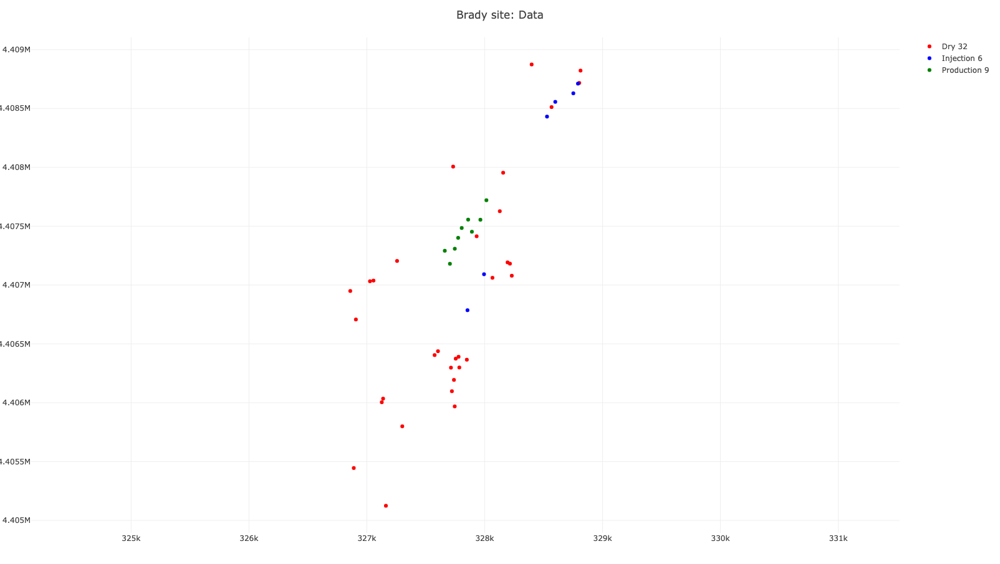

In [46]:
display("image/png", read("./map/dataset-set01-v9-inv.png"))

## ML analysis

For the ML analyses, the data tensor will be flatten two differnt ways.

### Flatten the tensor into a matrix (type 1)

Matrix rows merge the depth and attribute dimensions.

Matrix cols represent the well locations.

In [51]:
Xdaln = reshape(Tn, ((depth * length(attributes_process))), length(locations));

### Perform NMFk analyses

Here the **NMFk** results are loaded from a prior ML runs.

In [55]:
W, H, fitquality, robustness, aic = NMFk.execute(Xdaln, nkrange, nruns; resultdir=resultdir, casefilename="nmfk-daln-$(join(size(Xdaln), '_'))", load=true)
W, H, fitquality, robustness, aic = NMFk.load(nkrange, nruns; resultdir=resultdir, casefilename="nmfk-daln-$(join(size(Xdaln), '_'))");

Signals:  2 Fit:     17906.11 Silhouette:    0.6571116 AIC:    -944054.7
Signals:  3 Fit:     15067.48 Silhouette:    0.2121185 AIC:    -981003.7
Signals:  4 Fit:     12811.86 Silhouette:  -0.03854946 AIC:     -1014443
Signals:  5 Fit:     10966.81 Silhouette:    0.4108927 AIC:     -1045640
Signals:  6 Fit:     9570.522 Silhouette:    0.4704617 AIC:     -1070343
Signals:  7 Fit:     8398.009 Silhouette:   -0.2070509 AIC:     -1093198
Signals:  8 Fit:     7428.398 Silhouette:   -0.2601539 AIC:     -1113361
Signals:  2 Fit:     17906.11 Silhouette:    0.6571116 AIC:    -944054.7
Signals:  3 Fit:     15067.48 Silhouette:    0.2121185 AIC:    -981003.7
Signals:  4 Fit:     12811.86 Silhouette:  -0.03854946 AIC:     -1014443
Signals:  5 Fit:     10966.81 Silhouette:    0.4108927 AIC:     -1045640
Signals:  6 Fit:     9570.522 Silhouette:    0.4704617 AIC:     -1070343
Signals:  7 Fit:     8398.009 Silhouette:   -0.2070509 AIC:     -1093198
Signals:  8 Fit:     7428.398 Silhouette:   -0.2601

As seen from the output the ML analyses identified that the optimal number of geothermal signatures in the dataset **6**.

Solutions with a number of signatures less than **6** are underfitting.

Solutions with a number of signatures greater than **6** are overfitting and unacceptable.

The set of accetable solutions are defined as follows:

In [58]:
NMFk.getks(nkrange, robustness[nkrange])

3-element Array{Int64,1}:
 2
 5
 6

The accceptable solutions contain 2, 5 and 6 signatures.

### Plot results

Plot representing solution quality (fit) and silhouette width (robistness) for different number of sigantures `k`:

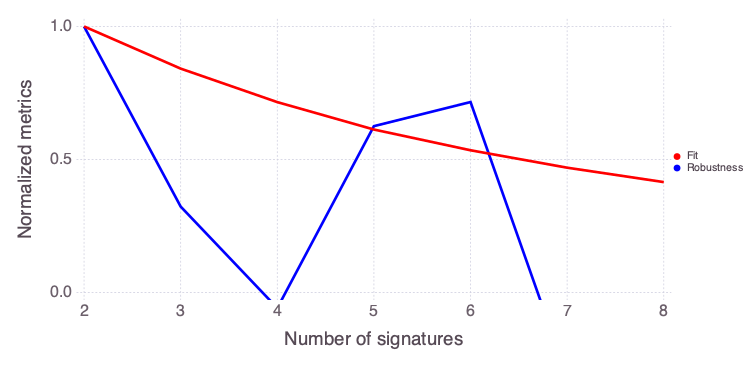

In [60]:
NMFk.plot_signal_selecton(nkrange, fitquality, robustness; figuredir="$figuredir-$(nruns)-daln", xtitle="Number of signatures")



The ML solutions containing 2, 5 and 6 signatures are further analyzed as follows:

┌ Info: Number of signals: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
Signal importance (high->low): [2, 1]
┌ Info: Locations (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-daln/Hmatrix-2-2_47-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconst

24×2 Array{Any,2}:
 "MGI-2"       1.0
 "B7"          0.971874
 "MG-2(SP-2)"  0.957147
 "64-1"        0.906381
 "B4"          0.902571
 "B6"          0.897107
 "B5"          0.874384
 "MG-1(SP-1)"  0.828417
 "B3"          0.82034
 "68A-1"       0.80013
 "B5A"         0.78864
 "MGI-1"       0.732217
 "68B-1"       0.696522
 "77-1"        0.655878
 "17-31"       0.57376
 "B8"          0.528089
 "55-1"        0.491206
 "EE-1"        0.487324
 "56-1"        0.455524
 "57-1"        0.43842
 "56B-1"       0.413443
 "18-1"        0.395716
 "18A-1"       0.370733
 "22-13"       0.269227

┌ Info: Signal B -> B Count: 23
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S1) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


23×2 Array{Any,2}:
 "18-31"   1.0
 "18B-31"  0.960836
 "56A-1"   0.878124
 "81-1"    0.859001
 "48A-1"   0.849051
 "81A-1"   0.838298
 "47C-1"   0.826181
 "B2"      0.804453
 "81B-1"   0.796872
 "46-1"    0.765556
 "46A-1"   0.763833
 "BCH-3"   0.735382
 "18D-31"  0.726398
 "15-12"   0.719203
 "27-1"    0.66714
 "81-11"   0.659873
 "88-11"   0.641011
 "BCH-1"   0.61491
 "B1"      0.58518
 "47A-1"   0.533141
 "BCH-2"   0.494268
 "26-12"   0.482354
 "82A-11"  0.354477

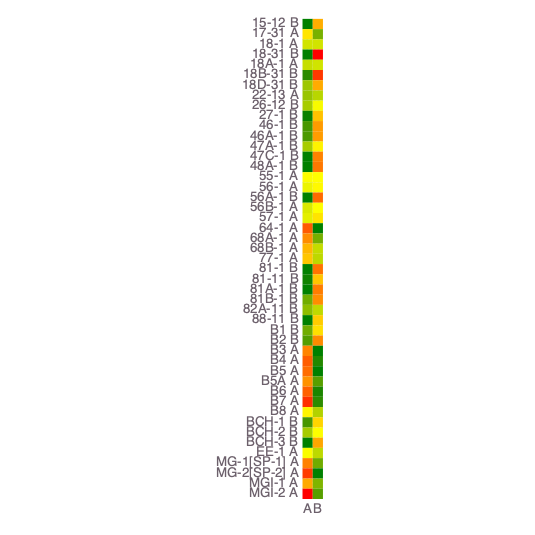

┌ Info: Signal B (S2) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


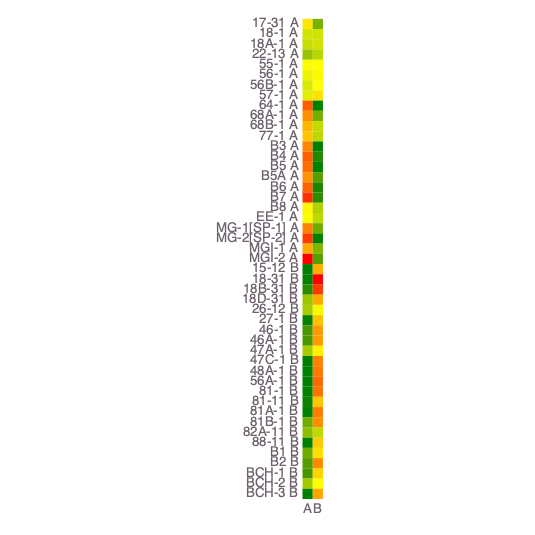

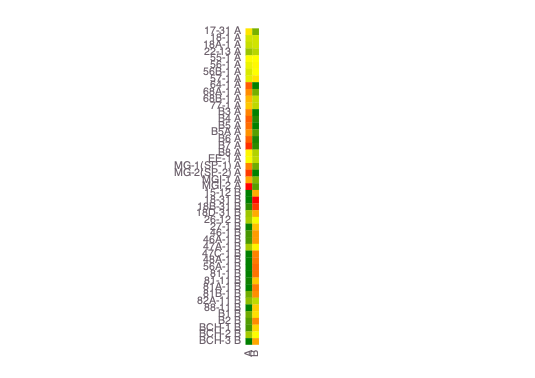

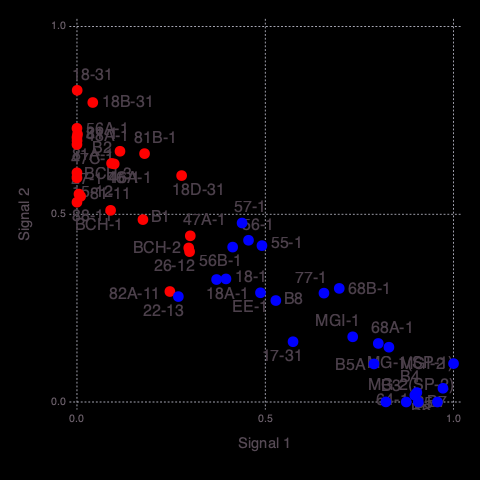

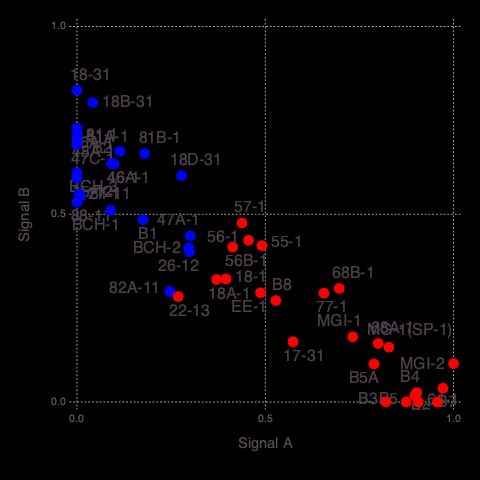

1×2 Array{Any,2}:
 "Inverse distance from contacts"  0.619519

13×2 Array{Any,2}:
 "Unit thickness"                1.0
 "Inverse distance from faults"  0.957468
 "Fault density"                 0.761708
 "Coulomb shear stress"          0.74607
 "Normal stress"                 0.737061
 "Faulting"                      0.706576
 "Fault intersection density"    0.702918
 "Dilation"                      0.635119
 "Fault dilation tendency"       0.605243
 "Fault curvature"               0.538705
 "Lithology"                     0.488473
 "Fault slip tendency"           0.41415
 "Temperature"                   0.131901

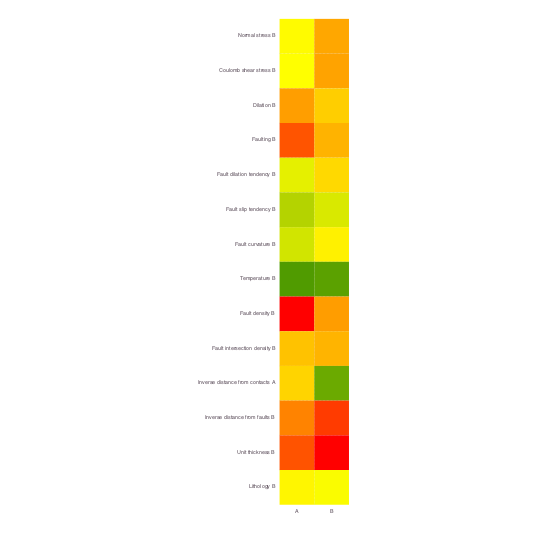

┌ Info: Attributes (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S2) Count: 13
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B -> A Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> B Count: 13
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360


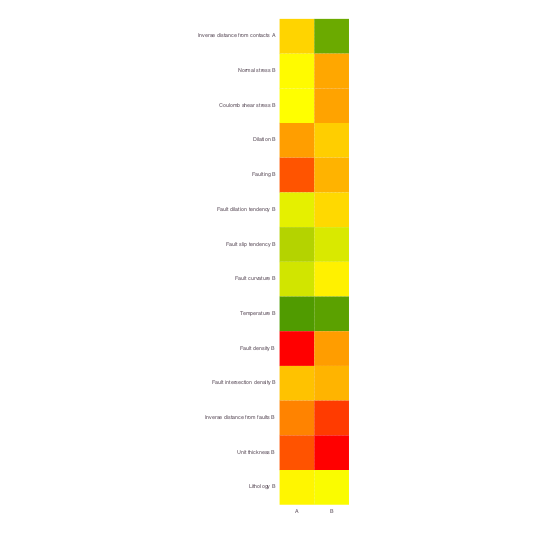

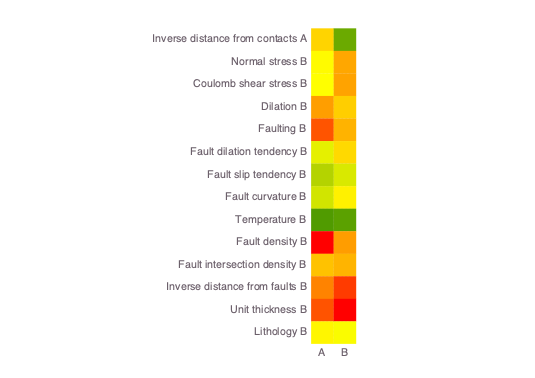

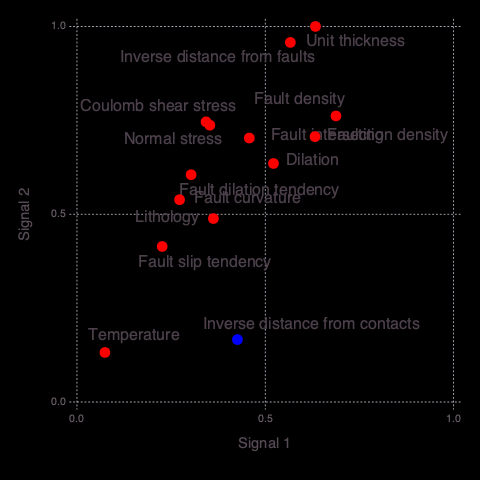

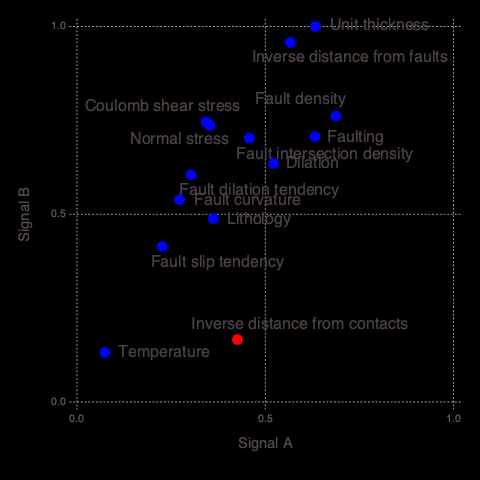

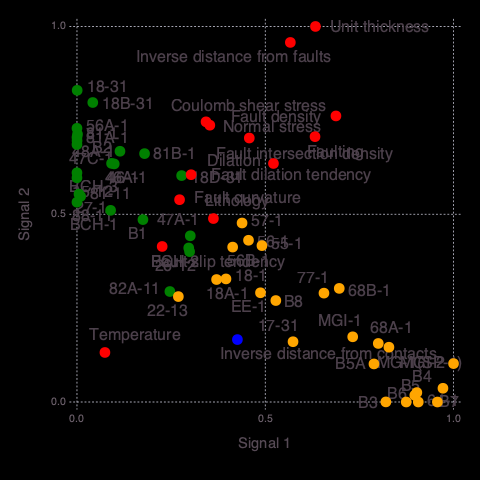

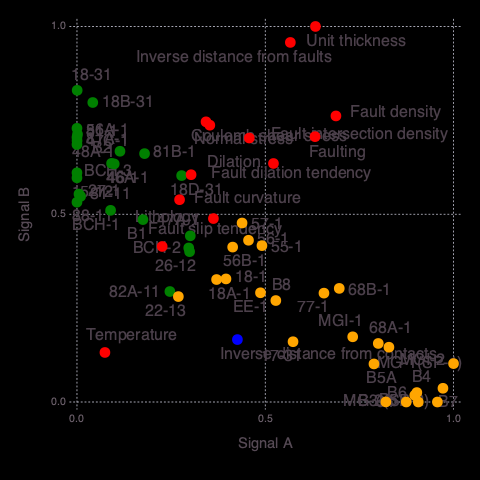

Signal importance (high->low): [1, 3, 5, 4, 2]
┌ Info: Number of signals: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=5)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-daln/Hmatrix-5-5_47-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/sr

11×2 Array{Any,2}:
 "MG-2(SP-2)"  1.0
 "56-1"        0.833071
 "18-31"       0.803582
 "18B-31"      0.79762
 "64-1"        0.771609
 "57-1"        0.731212
 "17-31"       0.675958
 "81B-1"       0.638129
 "18D-31"      0.542359
 "55-1"        0.482608
 "22-13"       0.384279

11×2 Array{Any,2}:
 "68A-1"       1.0
 "MG-1(SP-1)"  0.760228
 "B7"          0.583165
 "B3"          0.579901
 "B4"          0.559561
 "MGI-2"       0.550751
 "68B-1"       0.549639
 "B6"          0.533677
 "77-1"        0.51494
 "B5A"         0.492662
 "B5"          0.444441

9×2 Array{Any,2}:
 "56B-1"  1.0
 "B2"     0.952516
 "EE-1"   0.837563
 "48A-1"  0.787595
 "B8"     0.779397
 "B1"     0.711321
 "47C-1"  0.625562
 "81-11"  0.574423
 "47A-1"  0.549964

8×2 Array{Any,2}:
 "18-1"    1.0
 "82A-11"  0.947022
 "18A-1"   0.723864
 "88-11"   0.57605
 "15-12"   0.515703
 "BCH-3"   0.472471
 "27-1"    0.439353
 "56A-1"   0.3504

8×2 Array{Any,2}:
 "26-12"  0.82344
 "BCH-2"  0.822391
 "BCH-1"  0.766974
 "46A-1"  0.586862
 "81-1"   0.570404
 "81A-1"  0.545145
 "46-1"   0.529248
 "MGI-1"  0.456212

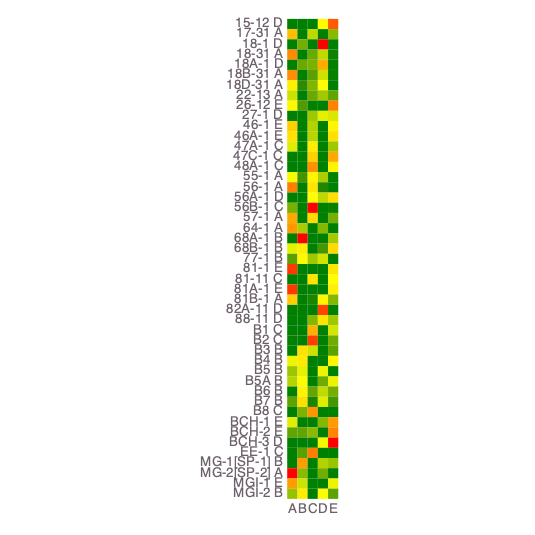

┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Info: Signal A -> A Count: 11
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 11
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal C -> C Count: 9
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal D -> D Count: 8
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal E -> E Count: 8
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S3) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Sig

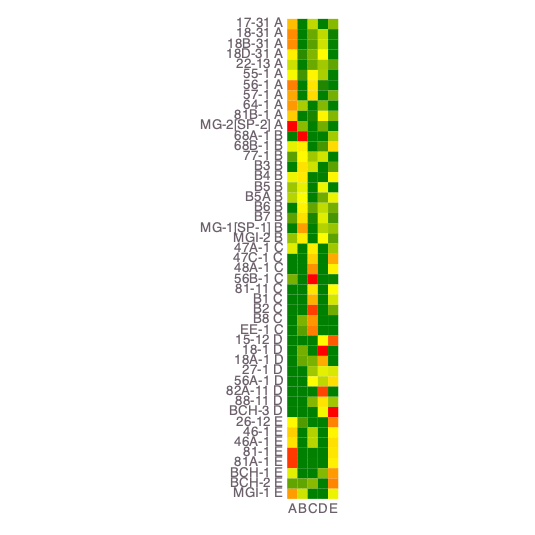

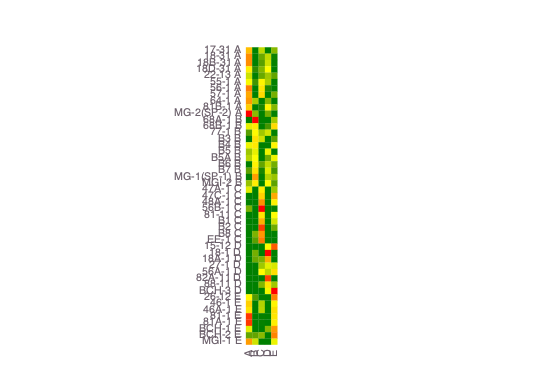

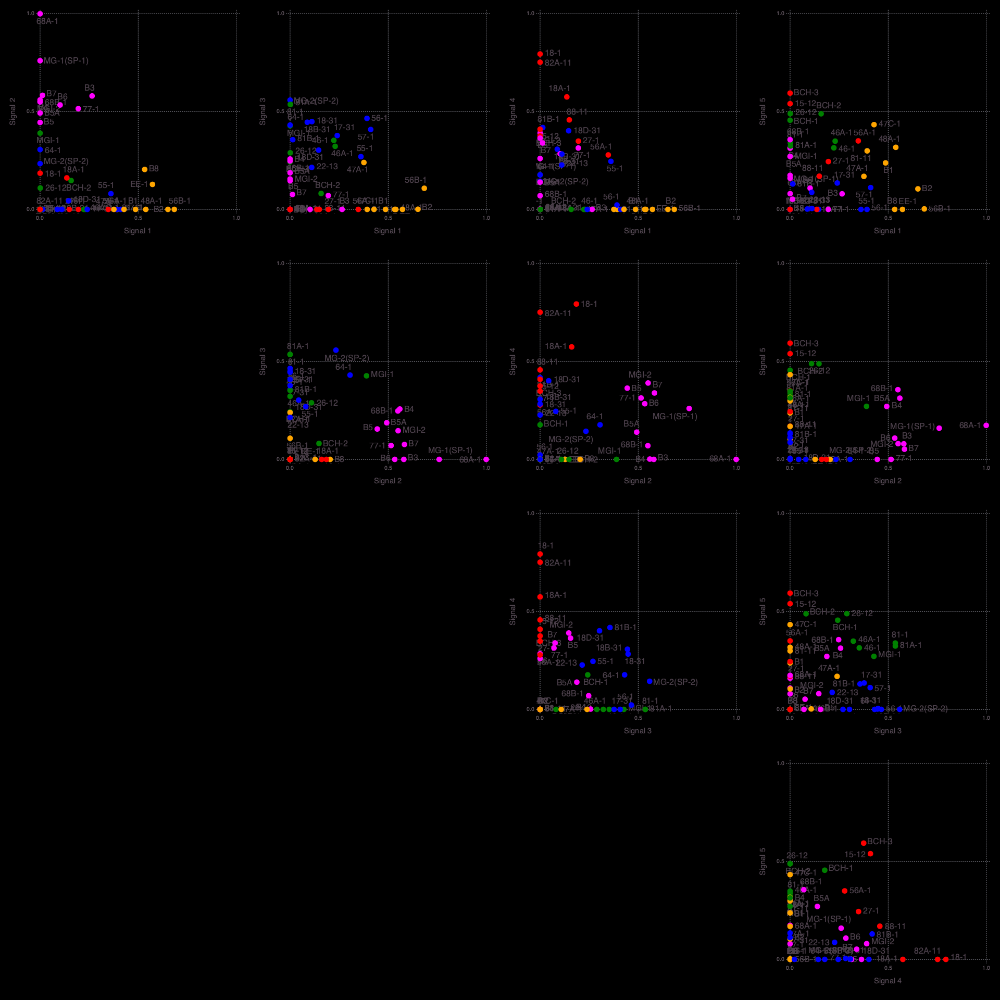

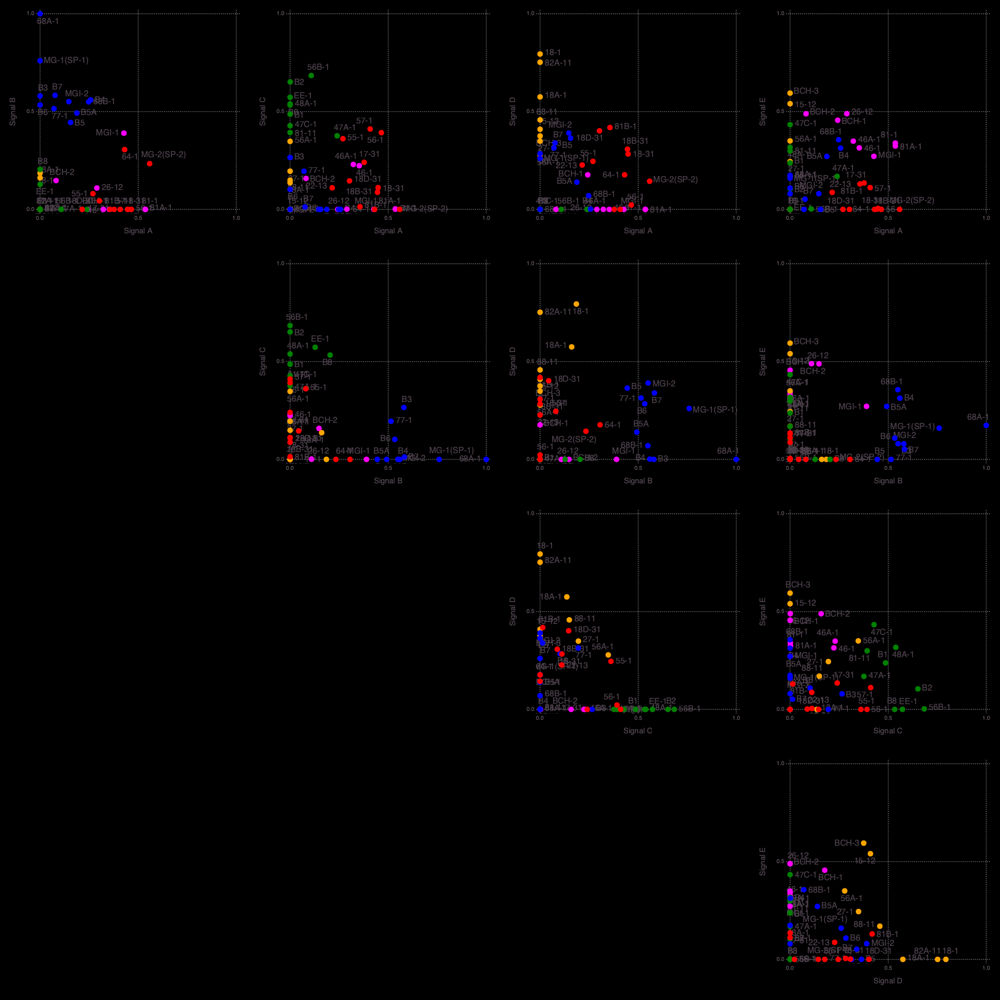

7×2 Array{Any,2}:
 "Unit thickness"                0.849937
 "Inverse distance from faults"  0.680541
 "Fault intersection density"    0.629292
 "Fault dilation tendency"       0.501789
 "Fault curvature"               0.449738
 "Fault slip tendency"           0.365781
 "Temperature"                   0.123165

1×2 Array{Any,2}:
 "Inverse distance from contacts"  1.0

3×2 Array{Any,2}:
 "Faulting"       0.892846
 "Fault density"  0.880551
 "Dilation"       0.841464

1×2 Array{Any,2}:
 "Lithology"  0.89235

2×2 Array{Any,2}:
 "Coulomb shear stress"  0.826886
 "Normal stress"         0.820471

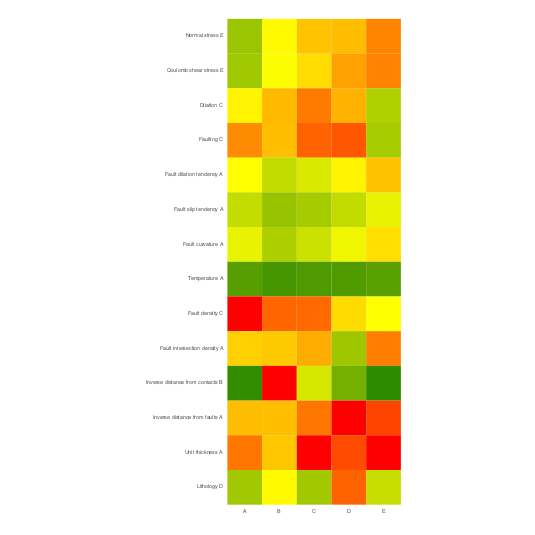

┌ Info: Attributes (signals=5)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S3) Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S5) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D (S2) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E (S4) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal A -> A Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal D -> B Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> C Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal E -> D Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal C -> E Count: 2
└ @ NMFk /Users/vvv/.julia/de

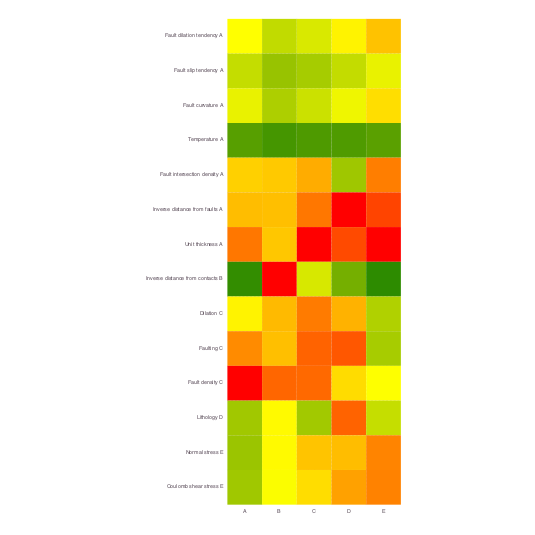

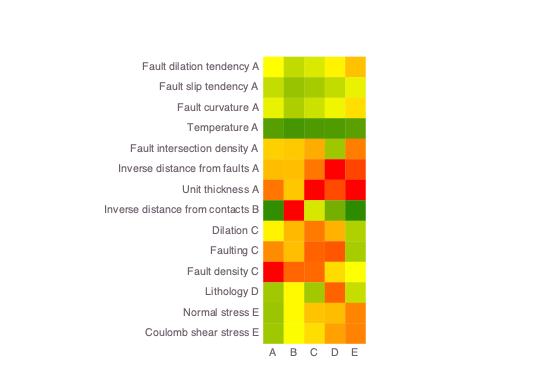

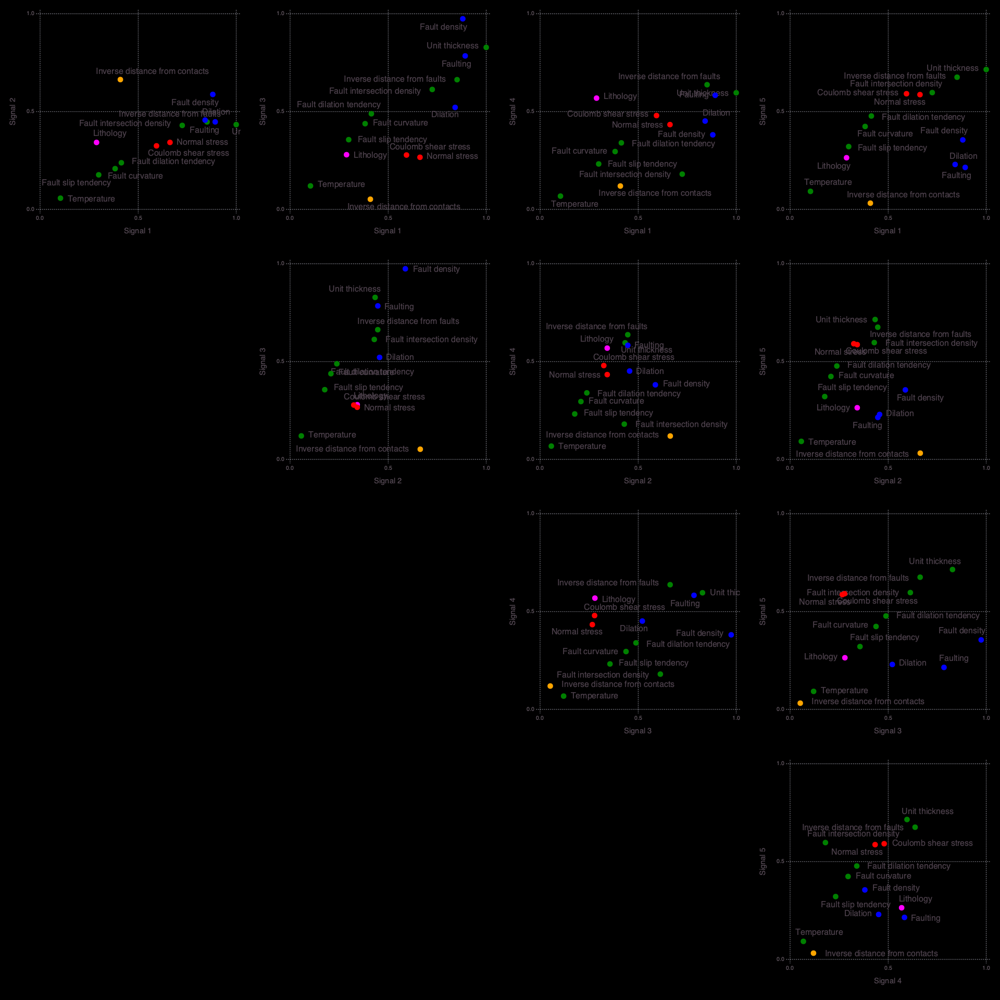

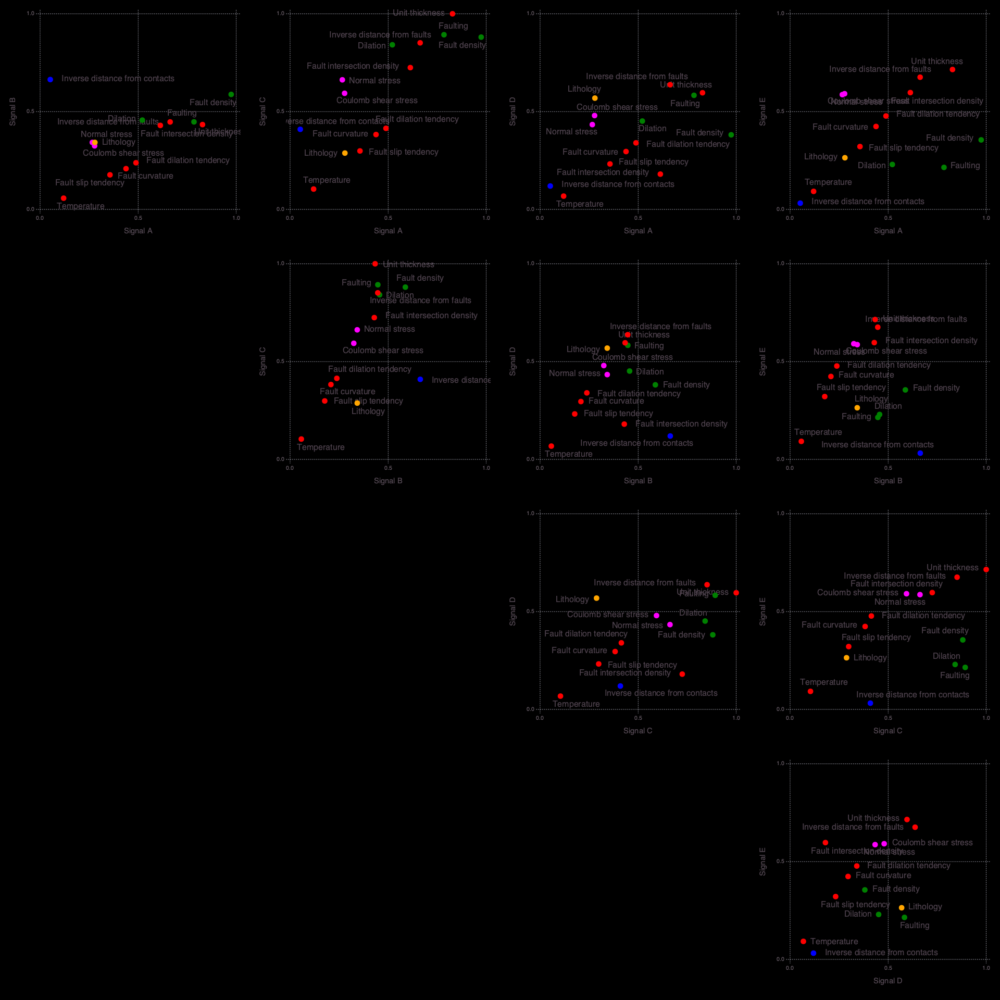

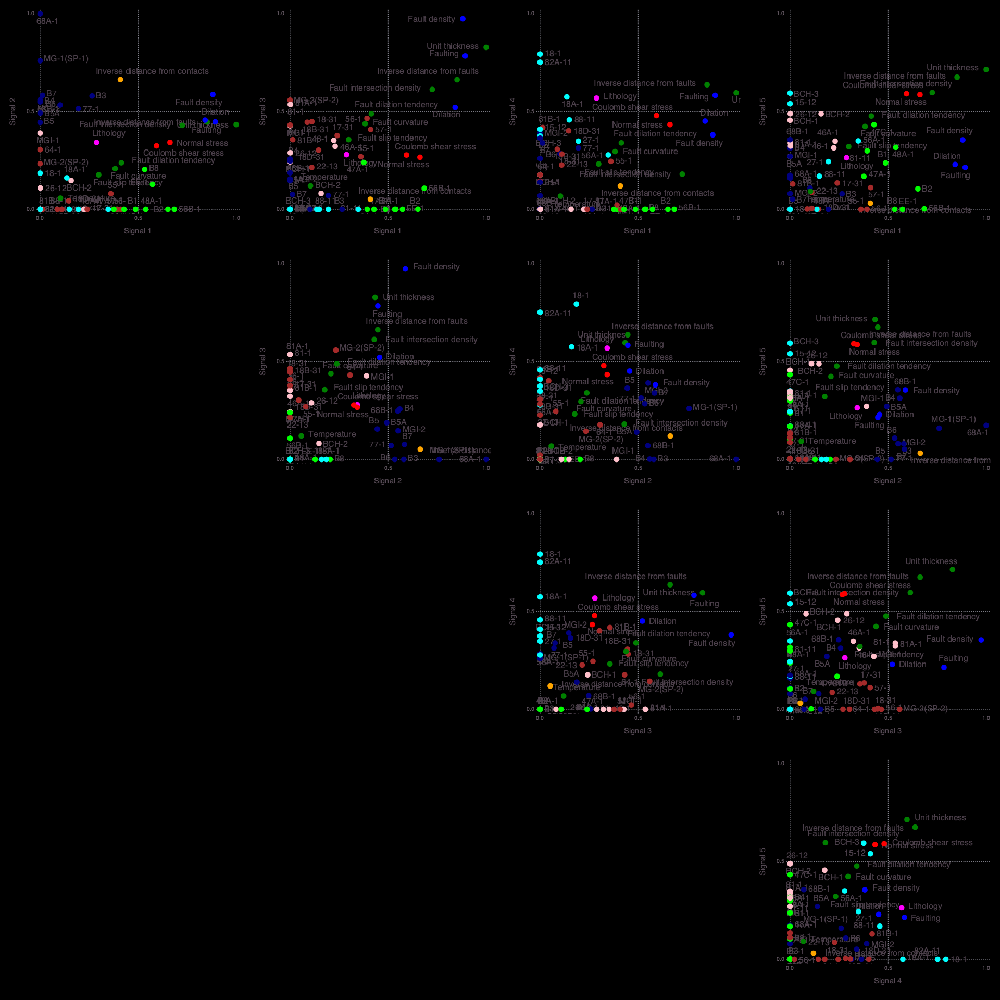

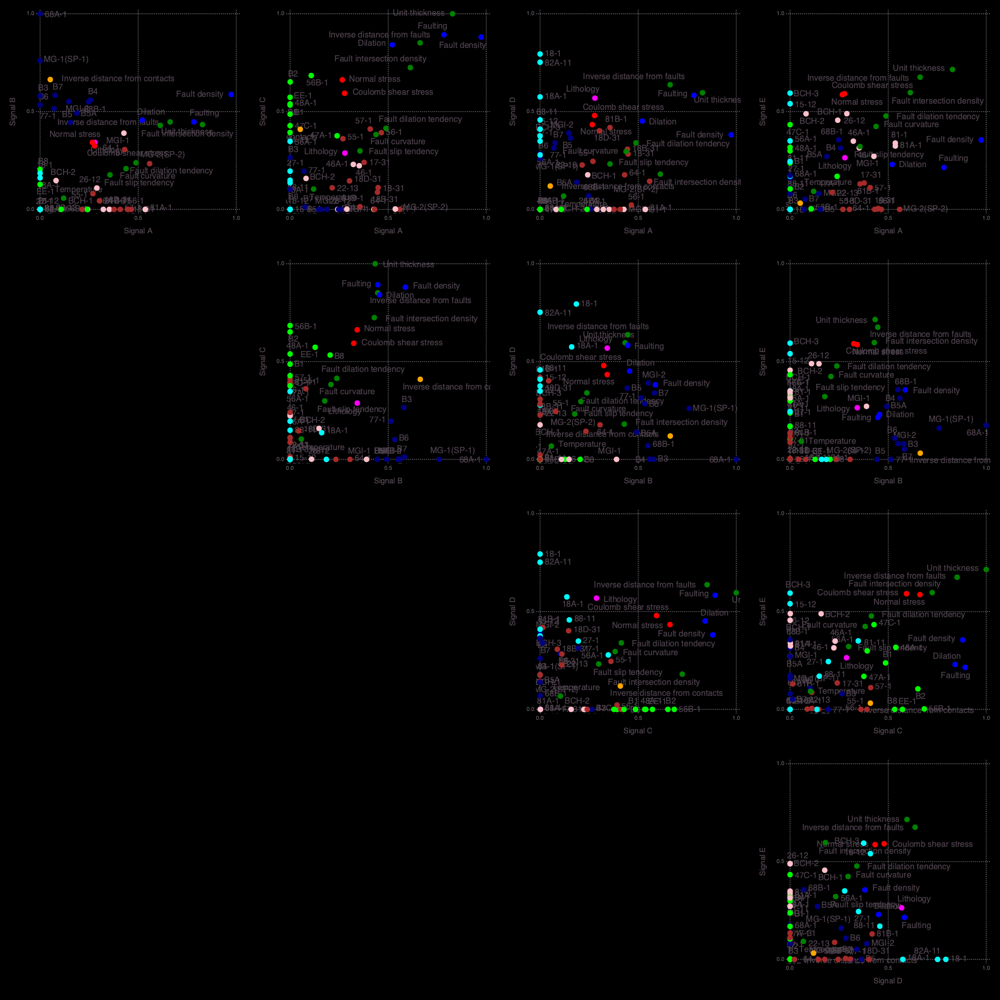

Signal importance (high->low): [1, 5, 2, 6, 4, 3]
┌ Info: Number of signals: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=6)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-daln/Hmatrix-6-6_47-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk

11×2 Array{Any,2}:
 "MG-1(SP-1)"  1.0
 "68B-1"       0.917059
 "77-1"        0.81018
 "B5A"         0.794163
 "68A-1"       0.771571
 "B5"          0.751175
 "B6"          0.726543
 "MGI-2"       0.712331
 "B7"          0.71064
 "B4"          0.671091
 "B3"          0.643308

10×2 Array{Any,2}:
 "82A-11"  1.0
 "88-11"   0.708797
 "18-1"    0.670833
 "27-1"    0.588465
 "18A-1"   0.586851
 "22-13"   0.530055
 "81B-1"   0.490522
 "18B-31"  0.450915
 "18D-31"  0.439487
 "18-31"   0.413683

7×2 Array{Any,2}:
 "MG-2(SP-2)"  1.0
 "64-1"        0.741999
 "MGI-1"       0.701663
 "56-1"        0.640372
 "57-1"        0.600702
 "17-31"       0.512659
 "55-1"        0.453248

7×2 Array{Any,2}:
 "B2"     1.0
 "EE-1"   0.68867
 "B8"     0.679526
 "56B-1"  0.56822
 "BCH-2"  0.521776
 "B1"     0.342468
 "81-11"  0.320946

6×2 Array{Any,2}:
 "BCH-3"  1.0
 "15-12"  0.904396
 "26-12"  0.808831
 "BCH-1"  0.795303
 "81-1"   0.7272
 "81A-1"  0.707665

6×2 Array{Any,2}:
 "47C-1"  1.0
 "46A-1"  0.943298
 "48A-1"  0.903309
 "46-1"   0.882457
 "47A-1"  0.751523
 "56A-1"  0.720315

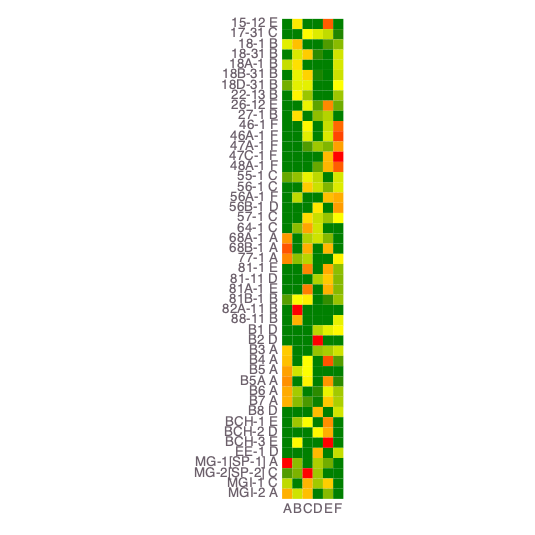

┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-daln/Wmatrix-6-6_14-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Info: Signal A -> A Count: 11
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 10
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal C -> C Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal D -> D Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal E -> E Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal F -> F Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S3) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Sign

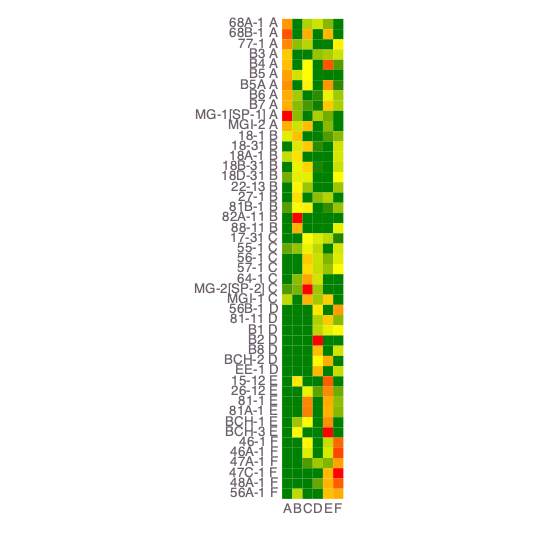

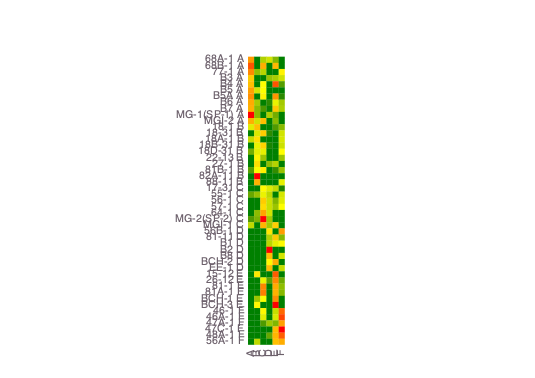

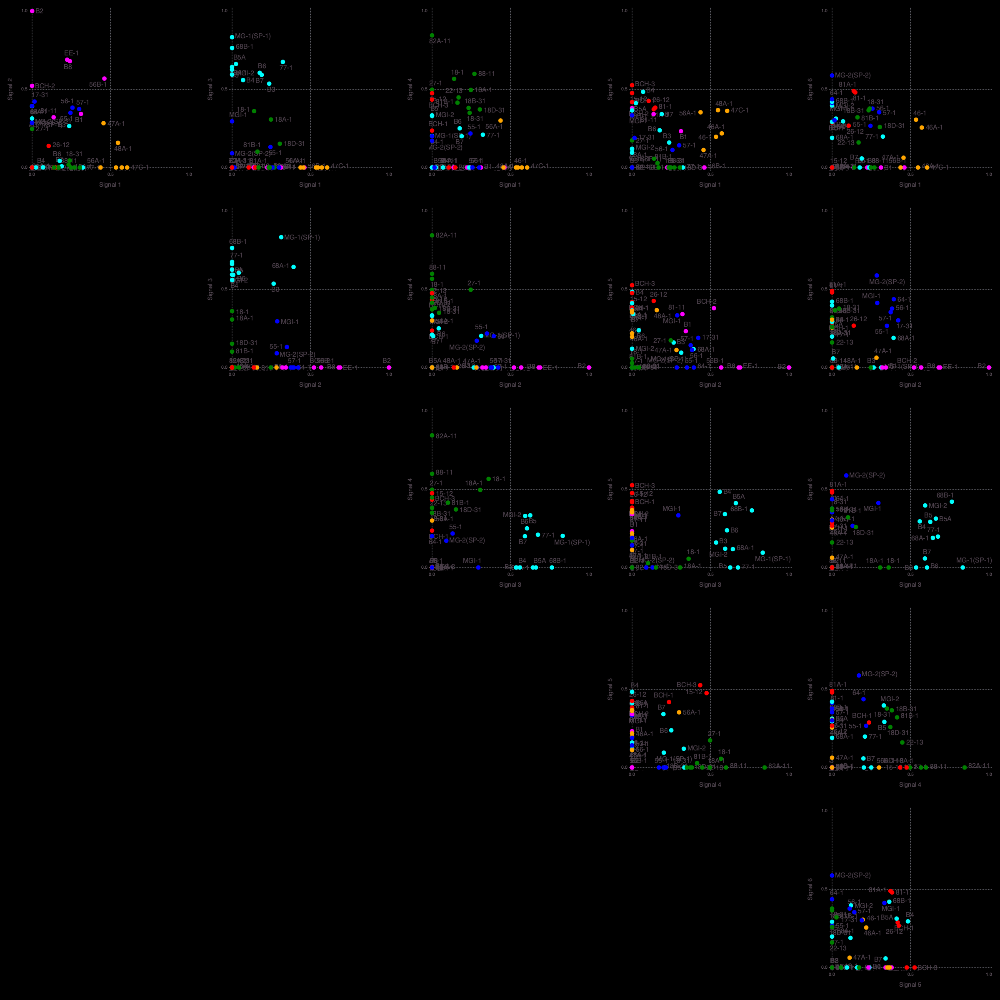

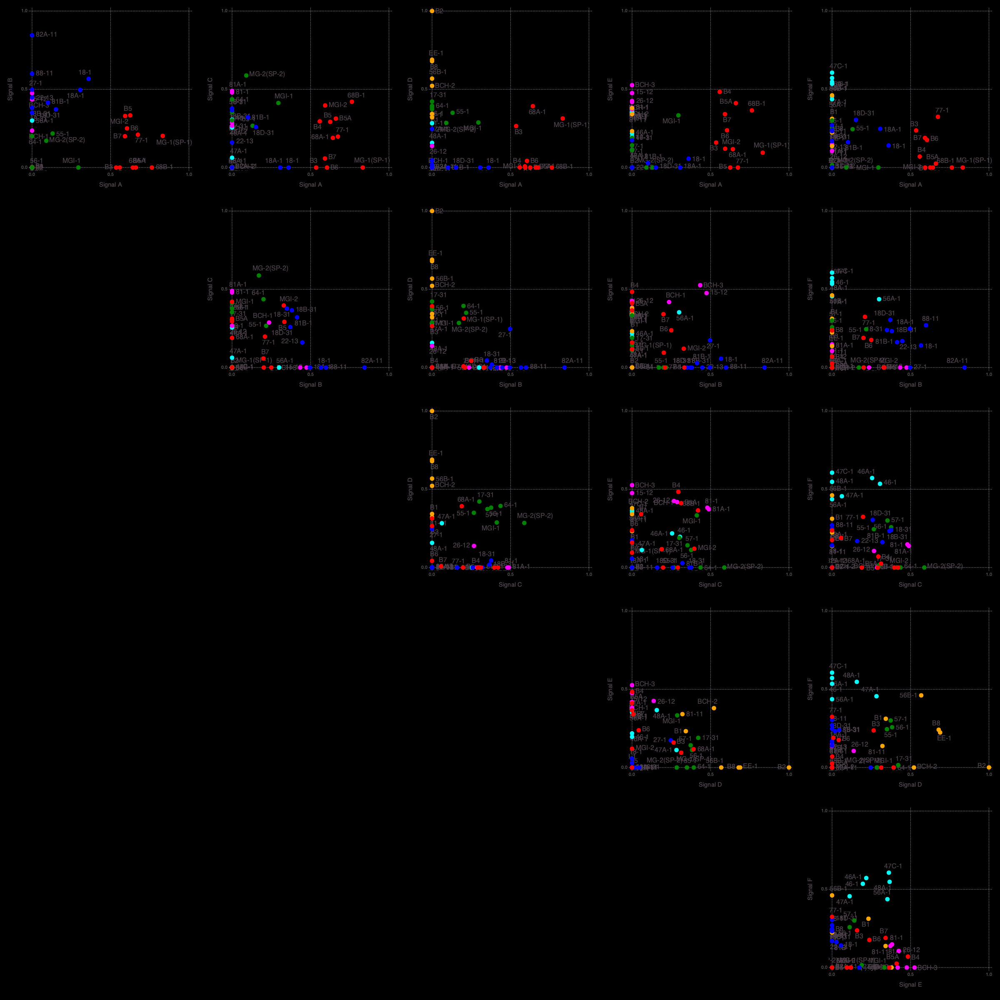

1×2 Array{Any,2}:
 "Inverse distance from contacts"  1.0

1×2 Array{Any,2}:
 "Lithology"  0.864227

5×2 Array{Any,2}:
 "Fault intersection density"  0.534767
 "Fault dilation tendency"     0.494983
 "Fault curvature"             0.444422
 "Fault slip tendency"         0.367193
 "Temperature"                 0.136511

2×2 Array{Any,2}:
 "Unit thickness"                1.0
 "Inverse distance from faults"  0.778501

2×2 Array{Any,2}:
 "Normal stress"         0.896801
 "Coulomb shear stress"  0.845105

3×2 Array{Any,2}:
 "Fault density"  1.0
 "Faulting"       0.877916
 "Dilation"       0.834909

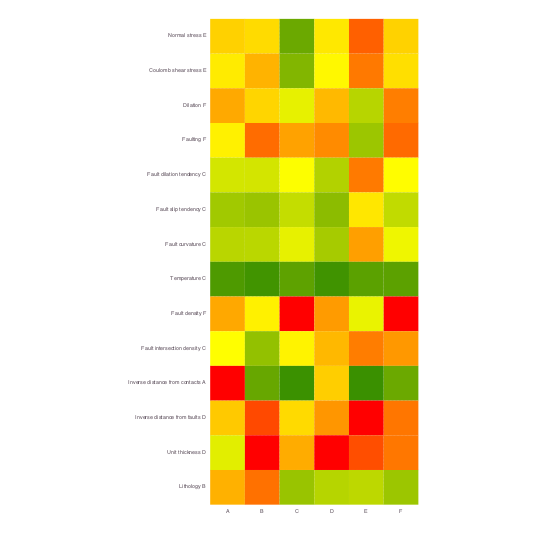

┌ Info: Attributes (signals=6)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S6) Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S5) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D (S2) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E (S3) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal F (S4) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E -> A Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal F -> B Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> C Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal D -> D Count: 2
└ @ NMFk /Users/vvv/.julia/de

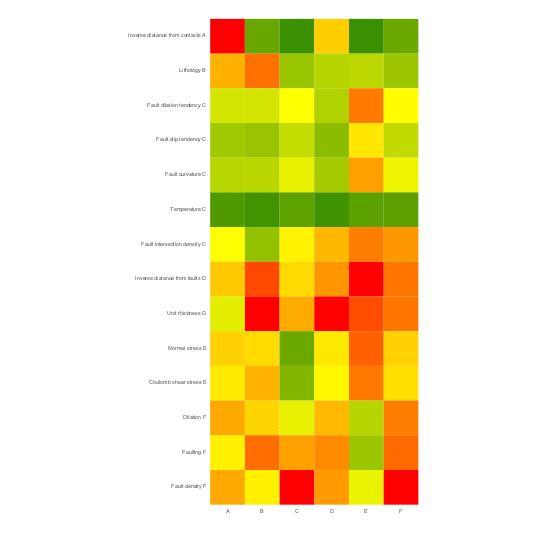

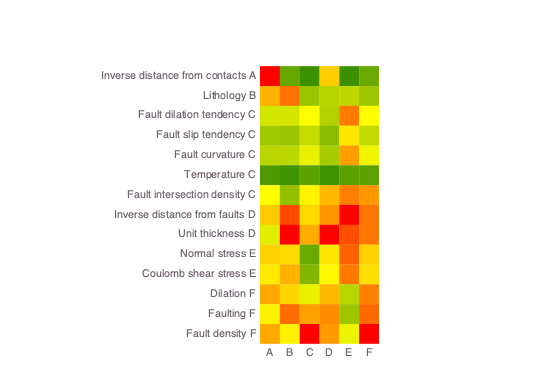

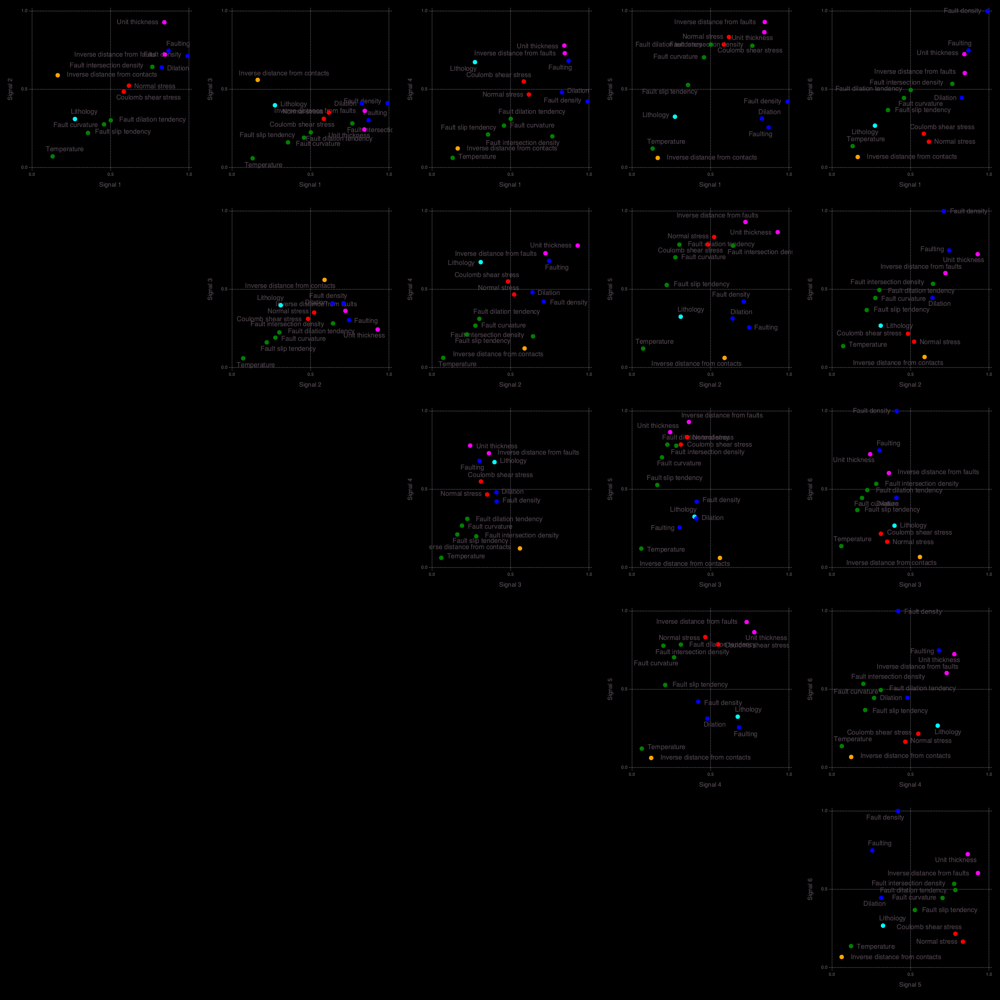

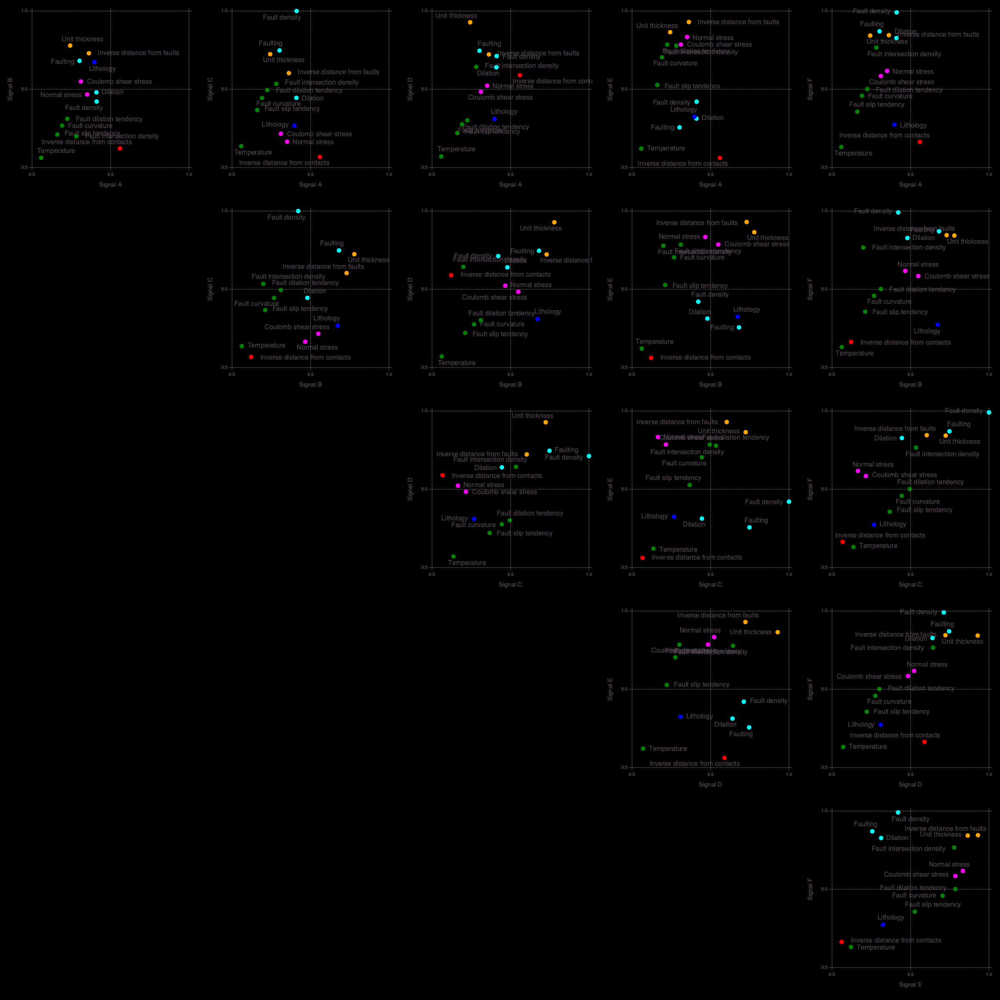

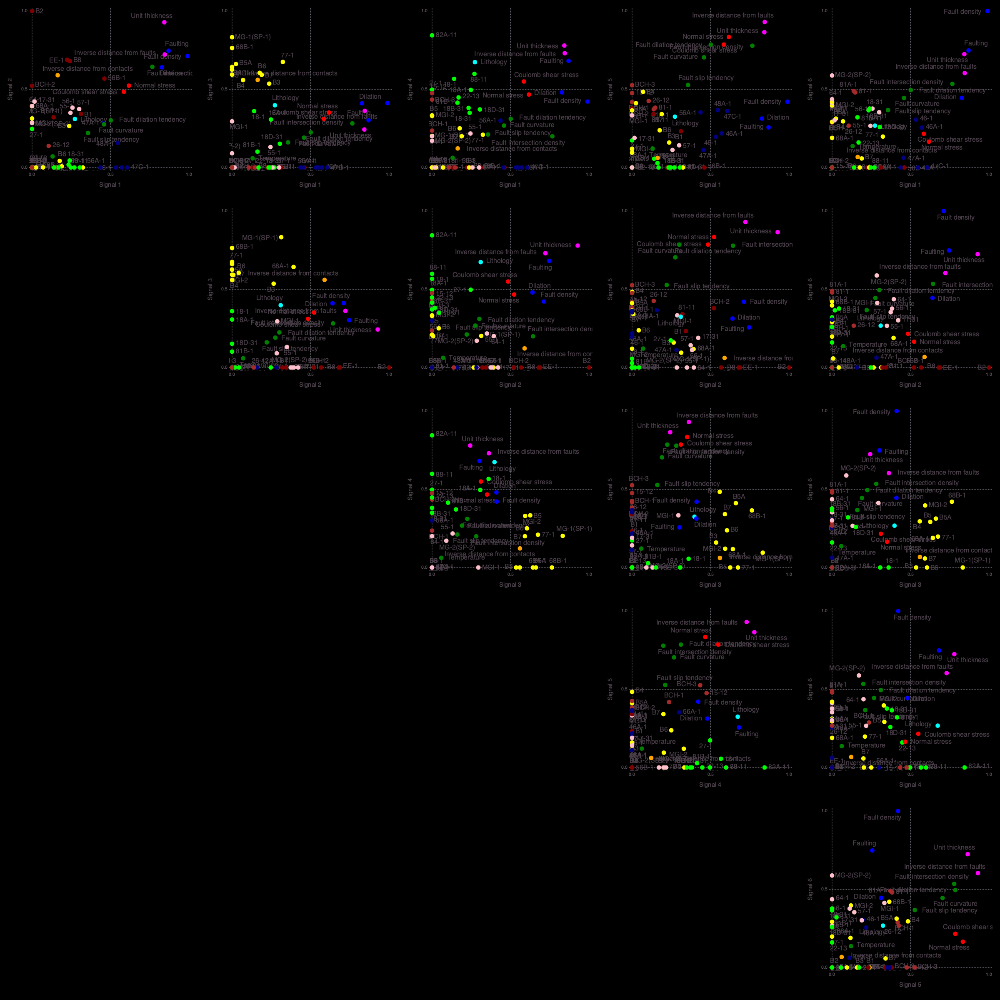

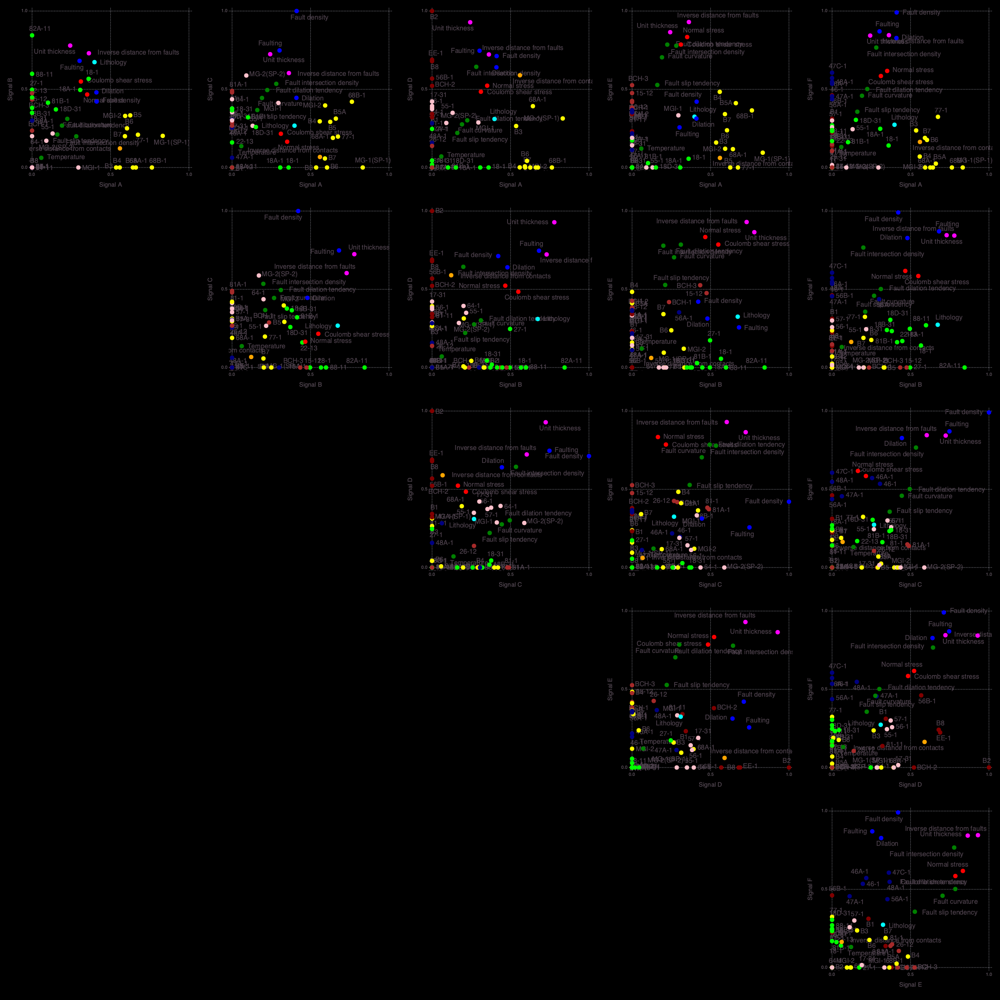

([[1, 2], [3, 2, 1, 4, 5], [3, 4, 6, 2, 5, 1]], [['B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'A', 'B', 'B', 'B'], ['E', 'E', 'C', 'C', 'A', 'A', 'A', 'A', 'C', 'A', 'B', 'A', 'A', 'D'], ['E', 'E', 'F', 'F', 'C', 'C', 'C', 'C', 'F', 'C', 'A', 'D', 'D', 'B']], [['B', 'A', 'A', 'B', 'A', 'B', 'B', 'A', 'B', 'B'  …  'A', 'A', 'B', 'B', 'B', 'A', 'A', 'A', 'A', 'A'], ['D', 'A', 'D', 'A', 'D', 'A', 'A', 'A', 'E', 'D'  …  'B', 'C', 'E', 'E', 'D', 'C', 'B', 'A', 'E', 'B'], ['E', 'C', 'B', 'B', 'B', 'B', 'B', 'B', 'E', 'B'  …  'A', 'D', 'E', 'D', 'E', 'D', 'A', 'C', 'C', 'A']])

In [62]:
NMFk.clusterresults(NMFk.getks(nkrange, robustness[nkrange]), W, H, attributes_process_long, locations; loadassignements=true, lon=xcoord, lat=ycoord, Wsize=depth, Wcasefilename="attributes", Hcasefilename="locations", resultdir=resultdir * "-$(nruns)-daln", figuredir=figuredir * "-$(nruns)-daln", hover="Well: " .* locations .* "<br>" .* "WellType: " .* String.(welltype) .* "<br>" .* production, Wmatrix_font_size=4Gadfly.pt, biplotcolor=:WH, biplotlabel=:WH)

### Flatten the tensor into a matrix (type 2)

Matrix rows merge the depth and well locations dimensions.

Matrix cols represent the well attributes.

In [64]:
Xdlan = reshape(permutedims(Tn, (1,3,2)), ((depth * length(locations))), length(attributes_process));

### Perform NMFk analyses

Here the **NMFk** results are loaded from a prior ML runs.

In [65]:
W, H, fitquality, robustness, aic = NMFk.execute(Xdlan, nkrange, nruns; resultdir=resultdir, casefilename="nmfk-dlan-$(join(size(Xdlan), '_'))", load=true)
W, H, fitquality, robustness, aic = NMFk.load(nkrange, nruns; resultdir=resultdir, casefilename="nmfk-dlan-$(join(size(Xdlan), '_'))");

Signals:  2 Fit:     8717.101 Silhouette:    0.9918721 AIC:     -1087260
Signals:  3 Fit:     6319.428 Silhouette:    0.5782437 AIC:     -1124899
Signals:  4 Fit:     4843.099 Silhouette:   -0.2086358 AIC:     -1143846
Signals:  5 Fit:     3526.994 Silhouette:   0.03306949 AIC:     -1179956
Signals:  6 Fit:     2430.352 Silhouette:   -0.5717948 AIC:     -1234661
Signals:  7 Fit:     1649.869 Silhouette:   -0.4817311 AIC:     -1294388
Signals:  8 Fit:     1182.794 Silhouette:    0.1610176 AIC:     -1335780
Signals:  2 Fit:     8717.101 Silhouette:    0.9918721 AIC:     -1087260
Signals:  3 Fit:     6319.428 Silhouette:    0.5782437 AIC:     -1124899
Signals:  4 Fit:     4843.099 Silhouette:   -0.2086358 AIC:     -1143846
Signals:  5 Fit:     3526.994 Silhouette:   0.03306949 AIC:     -1179956
Signals:  6 Fit:     2430.352 Silhouette:   -0.5717948 AIC:     -1234661
Signals:  7 Fit:     1649.869 Silhouette:   -0.4817311 AIC:     -1294388
Signals:  8 Fit:     1182.794 Silhouette:    0.1610

As seen from the output the ML analyses identified that the optimal number of geothermal signatures in the dataset **3**.

Solutions with a number of signatures less than **3** are underfitting.

Solutions with a number of signatures greater than **3** are overfitting and unacceptable.

The set of accetable solutions are defined as follows:

In [66]:
NMFk.getks(nkrange, robustness[nkrange])

2-element Array{Int64,1}:
 2
 3

The accceptable solutions contain 2 and 3 signatures.

### Plot results

Plot representing solution quality (fit) and silhouette width (robistness) for different number of sigantures `k`:

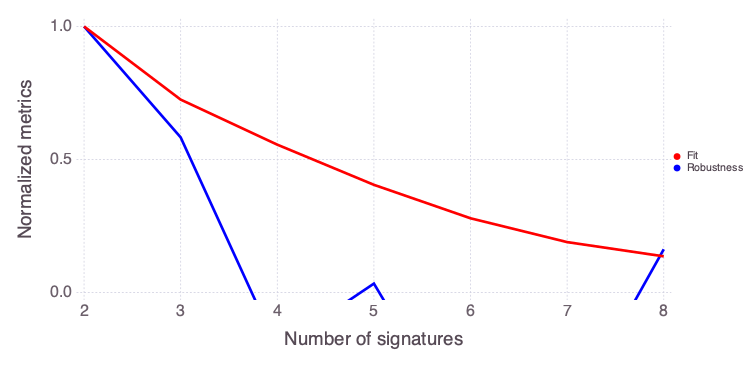

In [68]:
NMFk.plot_signal_selecton(nkrange, fitquality, robustness; figuredir="$figuredir-$(nruns)-dlan", xtitle="Number of signatures")

The ML solutions containing 2 and 3 signatures are further analyzed as follows:

Signal importance (high->low): [2, 1]
┌ Info: Number of signals: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Attributes (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-dlan/Hmatrix-2-2_14-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; recons

10×2 Array{Any,2}:
 "Unit thickness"                  1.0
 "Faulting"                        0.863986
 "Fault density"                   0.849999
 "Inverse distance from faults"    0.792619
 "Dilation"                        0.75876
 "Normal stress"                   0.674322
 "Fault intersection density"      0.673763
 "Coulomb shear stress"            0.672813
 "Lithology"                       0.501336
 "Inverse distance from contacts"  0.388519

4×2 Array{Any,2}:
 "Fault dilation tendency"  1.0
 "Fault curvature"          0.89069
 "Fault slip tendency"      0.706146
 "Temperature"              0.239306

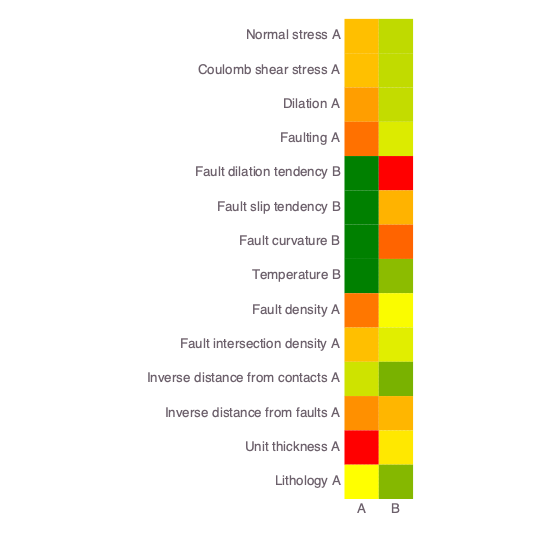

┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-dlan/Wmatrix-2-2_47-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Info: Signal A -> A Count: 10
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S2) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal B (S1) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


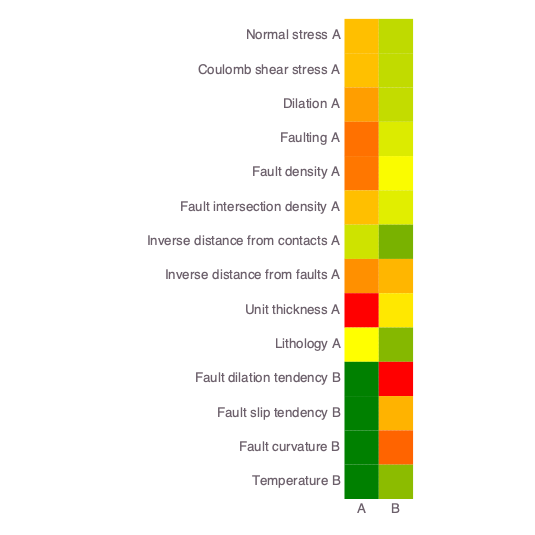

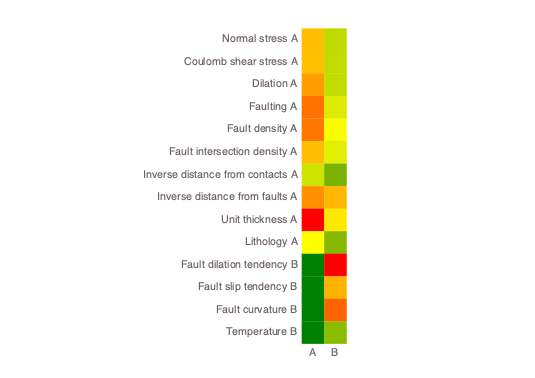

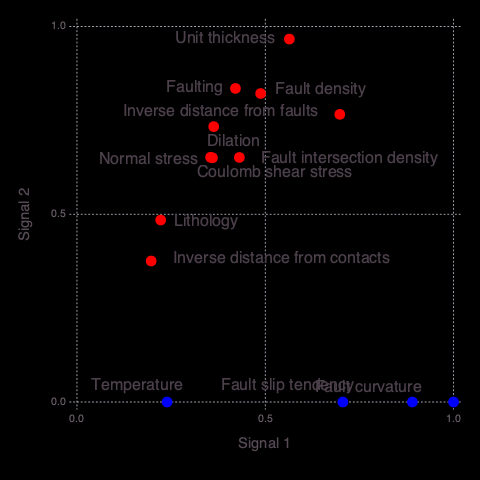

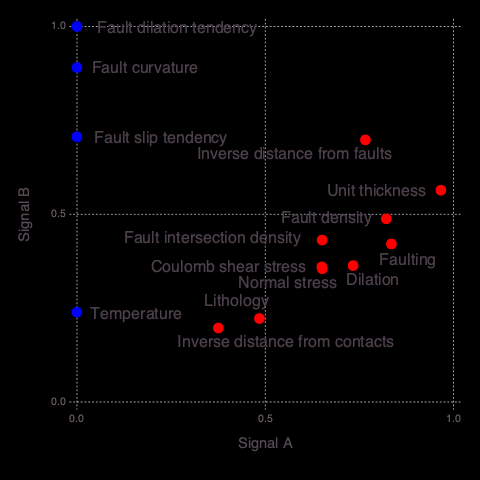

27×2 Array{Any,2}:
 "B8"          1.0
 "EE-1"        0.998613
 "MG-1(SP-1)"  0.956943
 "68A-1"       0.916159
 "64-1"        0.864026
 "47A-1"       0.859446
 "77-1"        0.857345
 "MG-2(SP-2)"  0.853707
 "27-1"        0.829554
 "82A-11"      0.807563
 "18A-1"       0.782265
 "47C-1"       0.745002
 "22-13"       0.734719
 ⋮             
 "88-11"       0.659403
 "46A-1"       0.629757
 "B5"          0.614479
 "46-1"        0.594959
 "48A-1"       0.590979
 "B1"          0.501909
 "56B-1"       0.497064
 "26-12"       0.472464
 "81-11"       0.416937
 "MGI-1"       0.24275
 "B3"          0.241753
 "B2"          0.127328

20×2 Array{Any,2}:
 "56-1"    1.0
 "55-1"    0.949937
 "57-1"    0.947965
 "BCH-3"   0.872622
 "15-12"   0.808709
 "68B-1"   0.758469
 "56A-1"   0.753147
 "BCH-1"   0.608981
 "B5A"     0.43926
 "17-31"   0.366493
 "18B-31"  0.348668
 "81B-1"   0.320223
 "18D-31"  0.298697
 "MGI-2"   0.291839
 "B4"      0.286734
 "18-31"   0.260379
 "B6"      0.257226
 "81-1"    0.234119
 "81A-1"   0.207054
 "B7"      0.156777

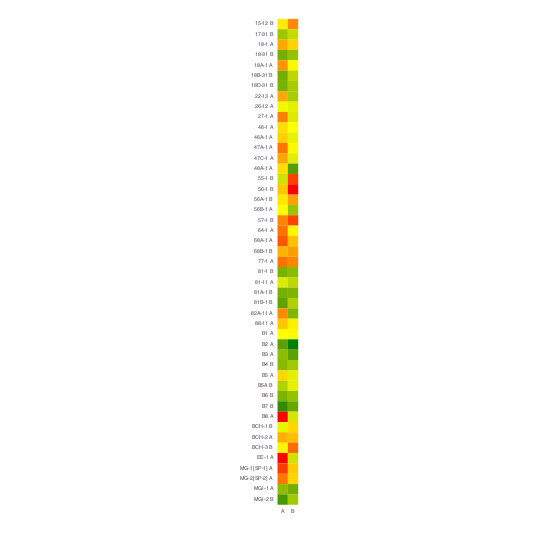

┌ Info: Locations (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S2) Count: 27
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 20
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal A -> A Count: 27
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> B Count: 20
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360


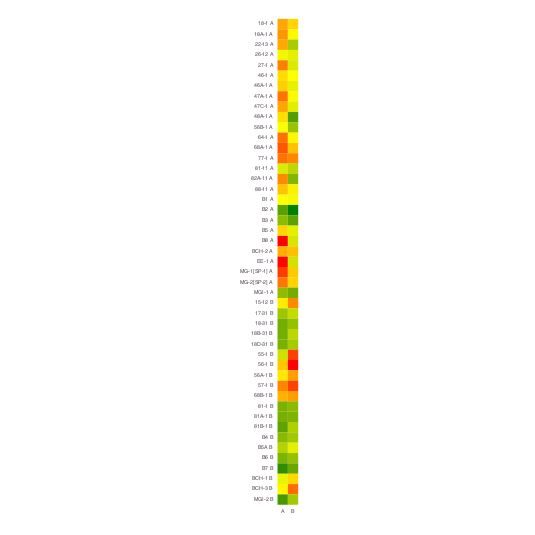

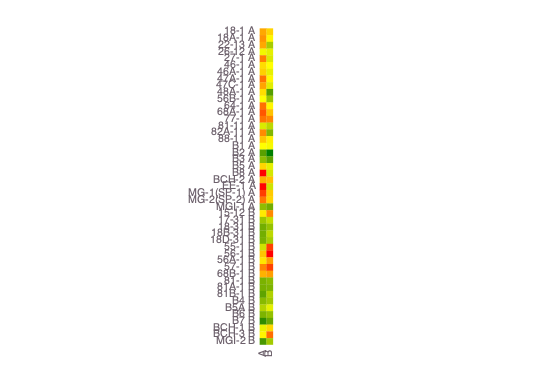

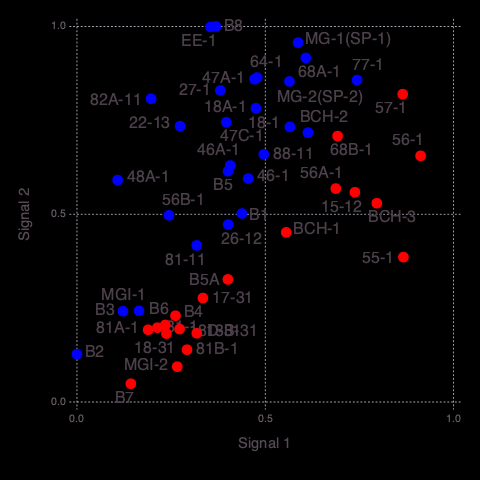

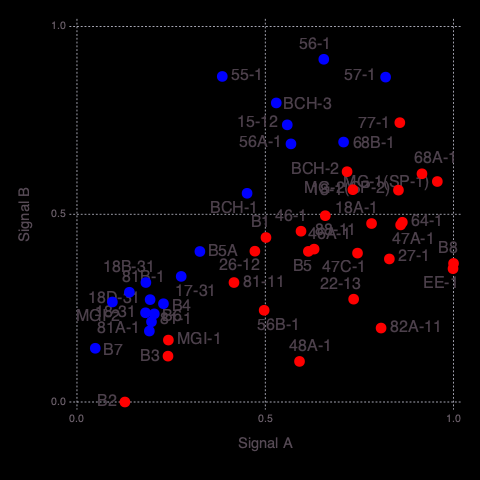

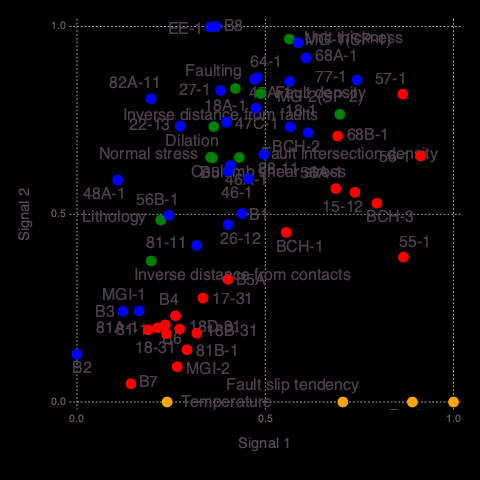

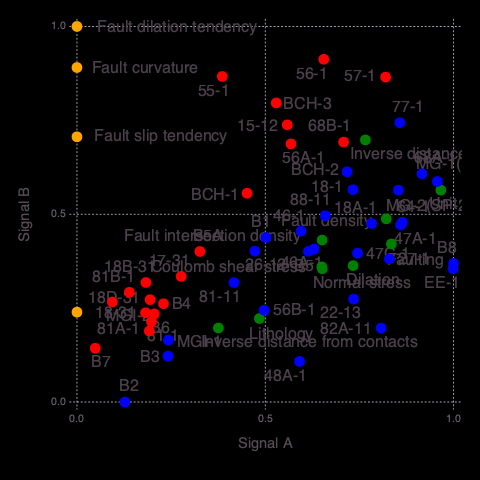

Signal importance (high->low): [3, 1, 2]
┌ Info: Number of signals: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Attributes (signals=3)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-set00-v9-inv-750-1000-dlan/Hmatrix-3-3_14-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMF

9×2 Array{Any,2}:
 "Unit thickness"                  1.0
 "Faulting"                        0.703863
 "Dilation"                        0.652914
 "Inverse distance from faults"    0.645557
 "Fault density"                   0.641279
 "Fault intersection density"      0.633706
 "Normal stress"                   0.558339
 "Coulomb shear stress"            0.544241
 "Inverse distance from contacts"  0.377979

4×2 Array{Any,2}:
 "Fault dilation tendency"  1.0
 "Fault curvature"          0.89069
 "Fault slip tendency"      0.706146
 "Temperature"              0.239306

1×2 Array{Any,2}:
 "Lithology"  1.0

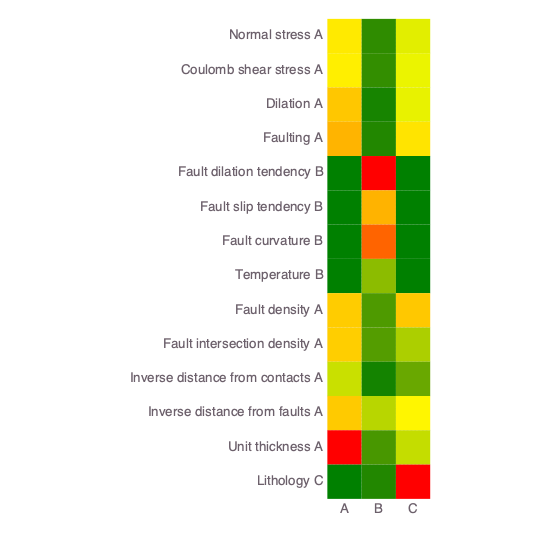

┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Info: Signal A -> A Count: 9
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal C -> C Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S3) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal B (S2) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal C (S1) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


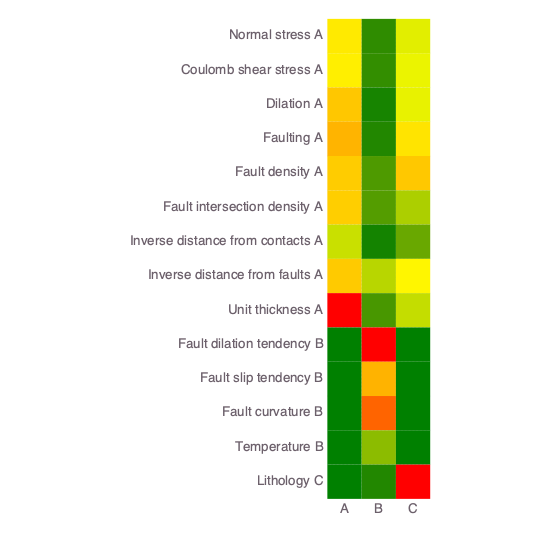

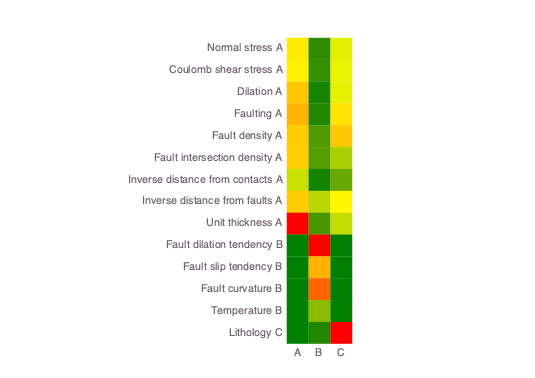

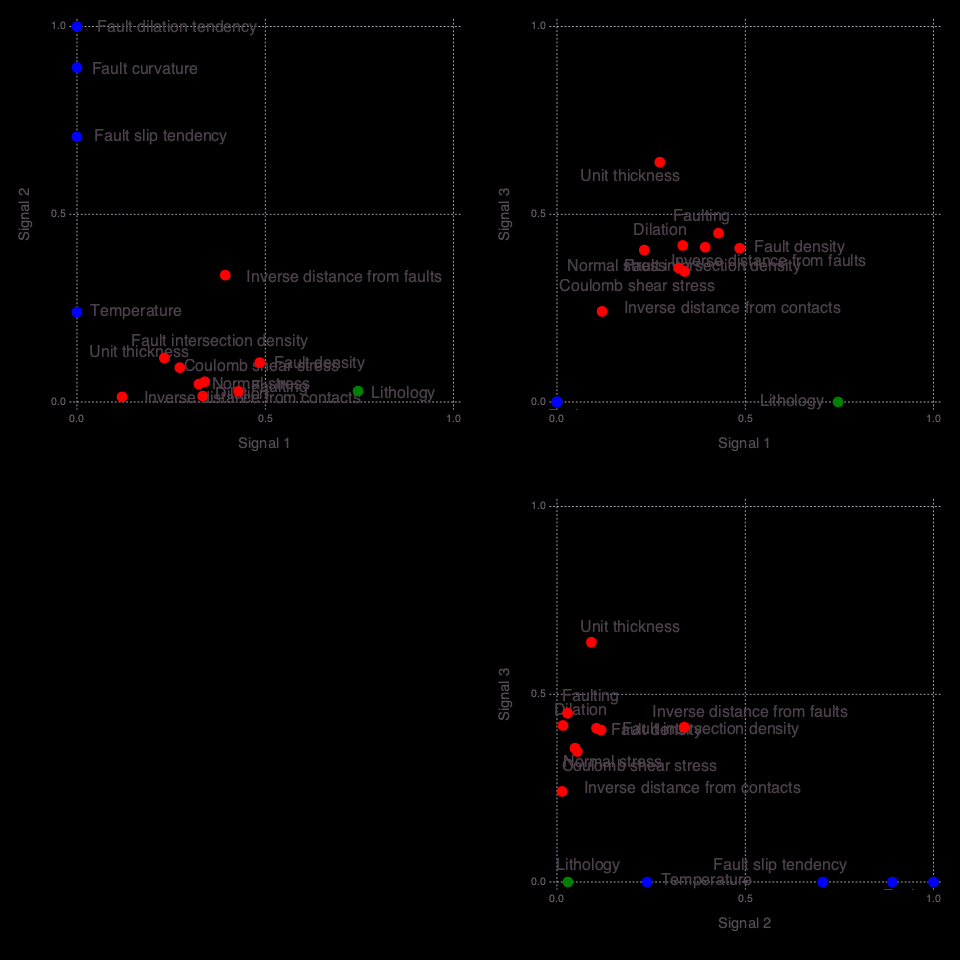

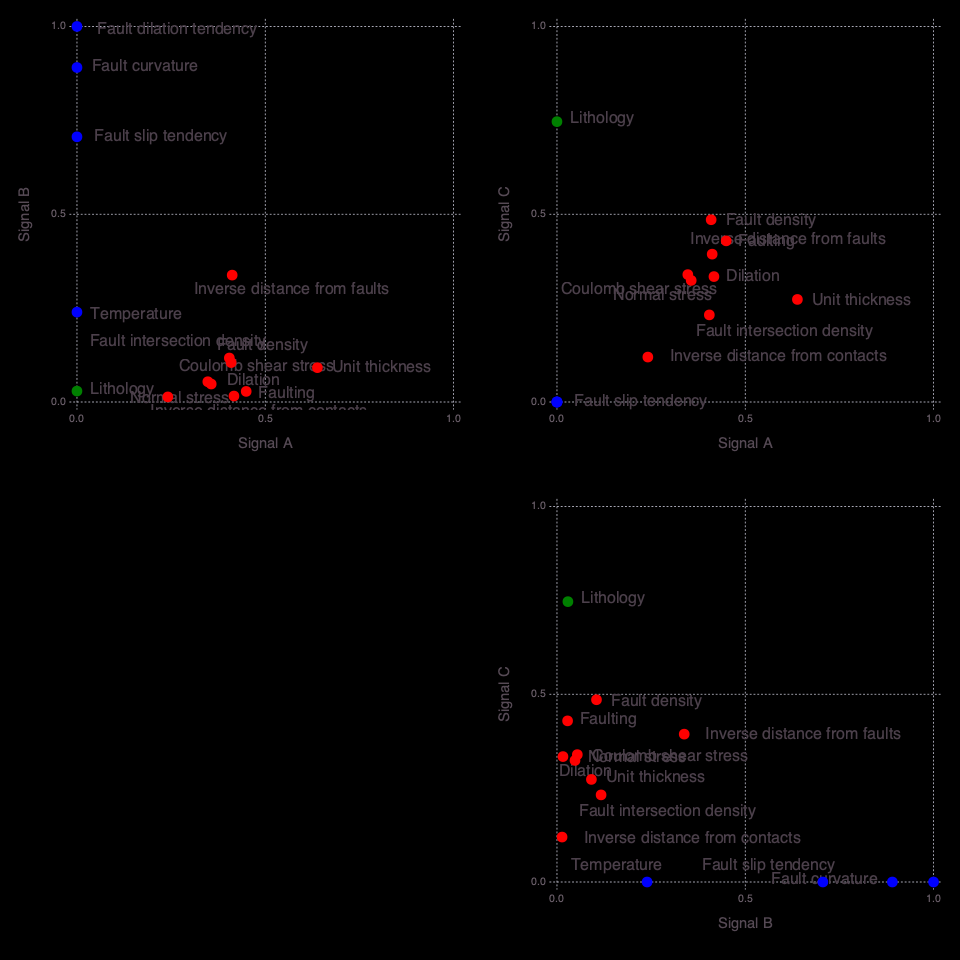

13×2 Array{Any,2}:
 "B8"     1.0
 "EE-1"   0.988215
 "47A-1"  0.905634
 "64-1"   0.867431
 "47C-1"  0.79874
 "27-1"   0.716696
 "46A-1"  0.699196
 "46-1"   0.675645
 "48A-1"  0.56726
 "56B-1"  0.557649
 "MGI-1"  0.286221
 "81A-1"  0.24804
 "B2"     0.0820308

20×2 Array{Any,2}:
 "56-1"        1.0
 "55-1"        0.951665
 "57-1"        0.947671
 "68B-1"       0.759123
 "56A-1"       0.752345
 "BCH-2"       0.67324
 "MG-2(SP-2)"  0.624464
 "BCH-1"       0.609265
 "B5A"         0.440143
 "B5"          0.439178
 "17-31"       0.372325
 "81-11"       0.353316
 "18B-31"      0.351038
 "81B-1"       0.32106
 "18D-31"      0.302397
 "MGI-2"       0.289056
 "B4"          0.286007
 "18-31"       0.261958
 "81-1"        0.234893
 "B7"          0.155895

14×2 Array{Any,2}:
 "88-11"       1.0
 "22-13"       0.890617
 "82A-11"      0.886939
 "68A-1"       0.878252
 "18-1"        0.872381
 "77-1"        0.834481
 "18A-1"       0.830688
 "MG-1(SP-1)"  0.807444
 "BCH-3"       0.805676
 "15-12"       0.791843
 "B1"          0.65222
 "26-12"       0.444381
 "B6"          0.213355
 "B3"          0.212844

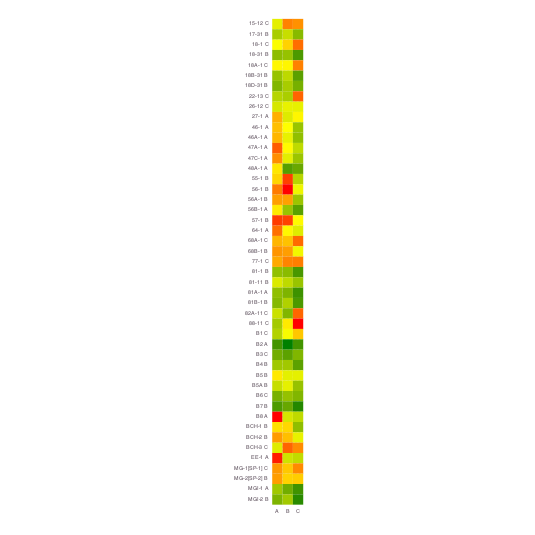

┌ Info: Locations (signals=3)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S2) Count: 20
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 14
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S3) Count: 13
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C -> A Count: 13
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> B Count: 20
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> C Count: 14
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal C (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360


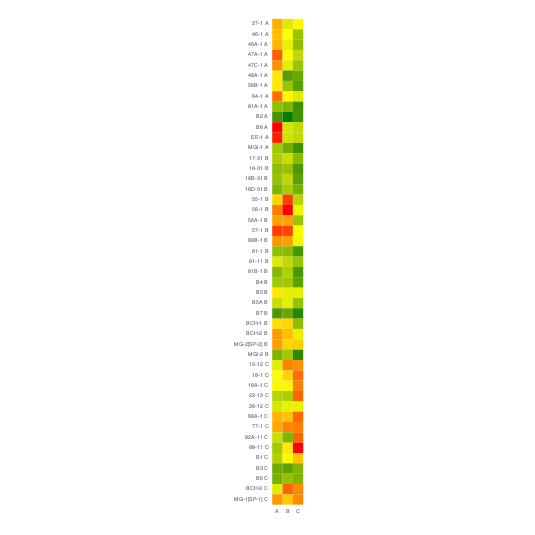

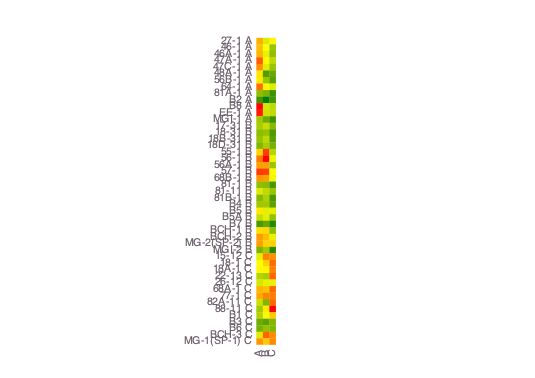

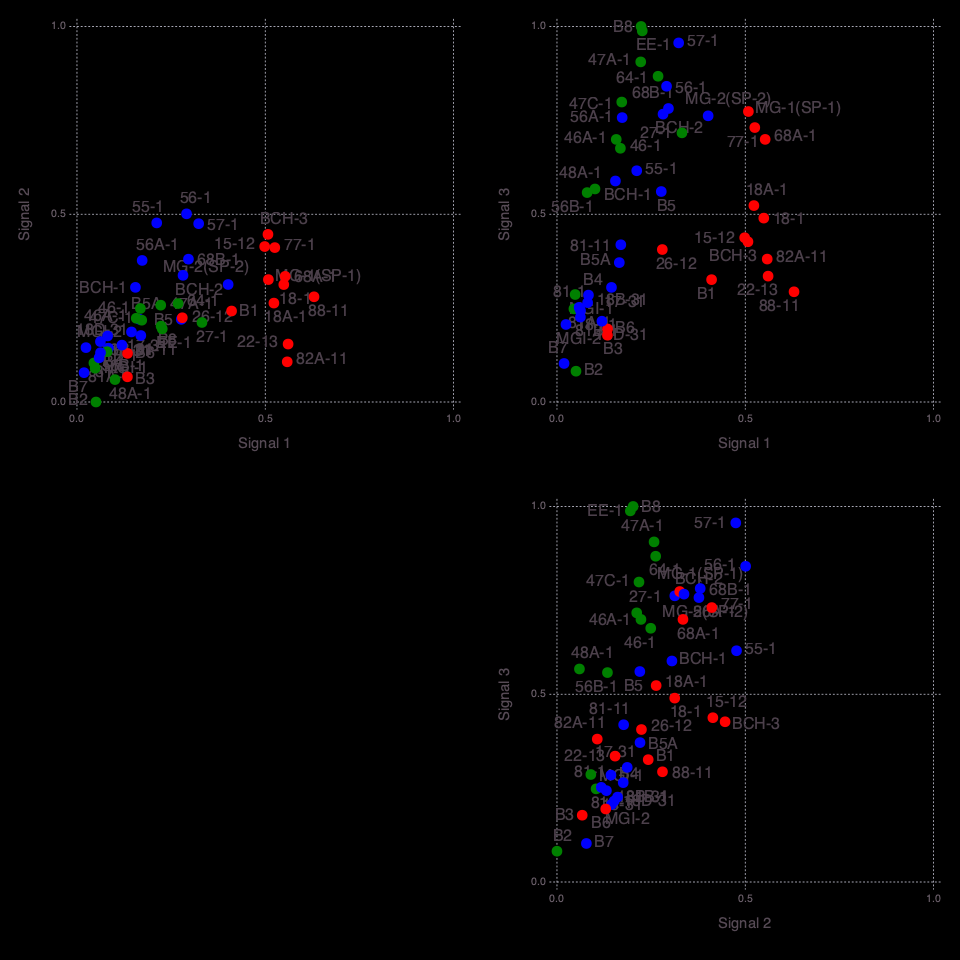

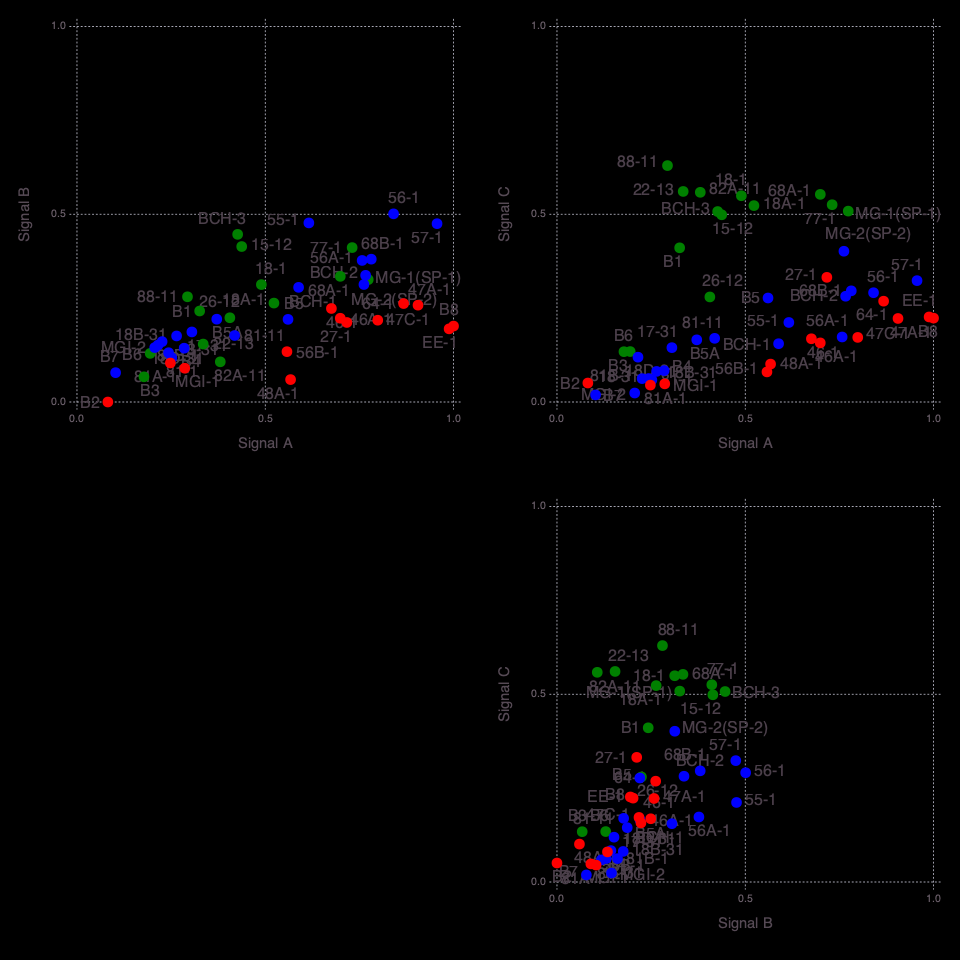

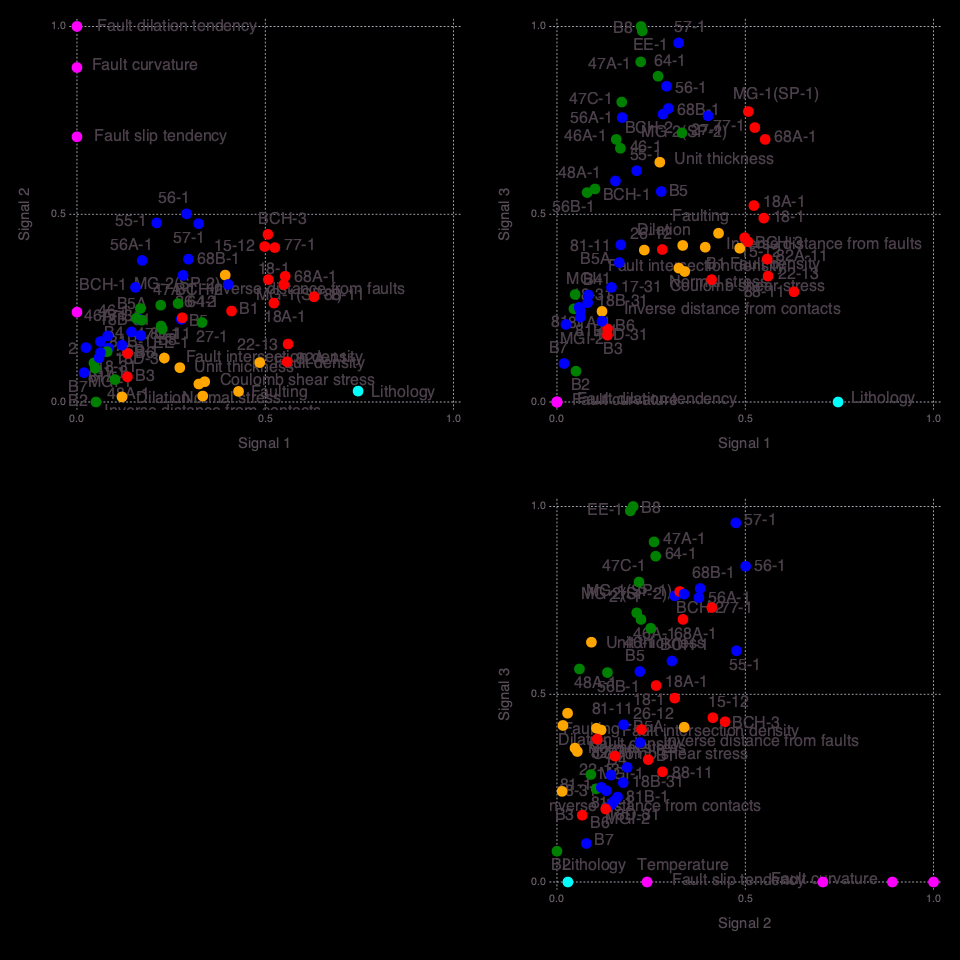

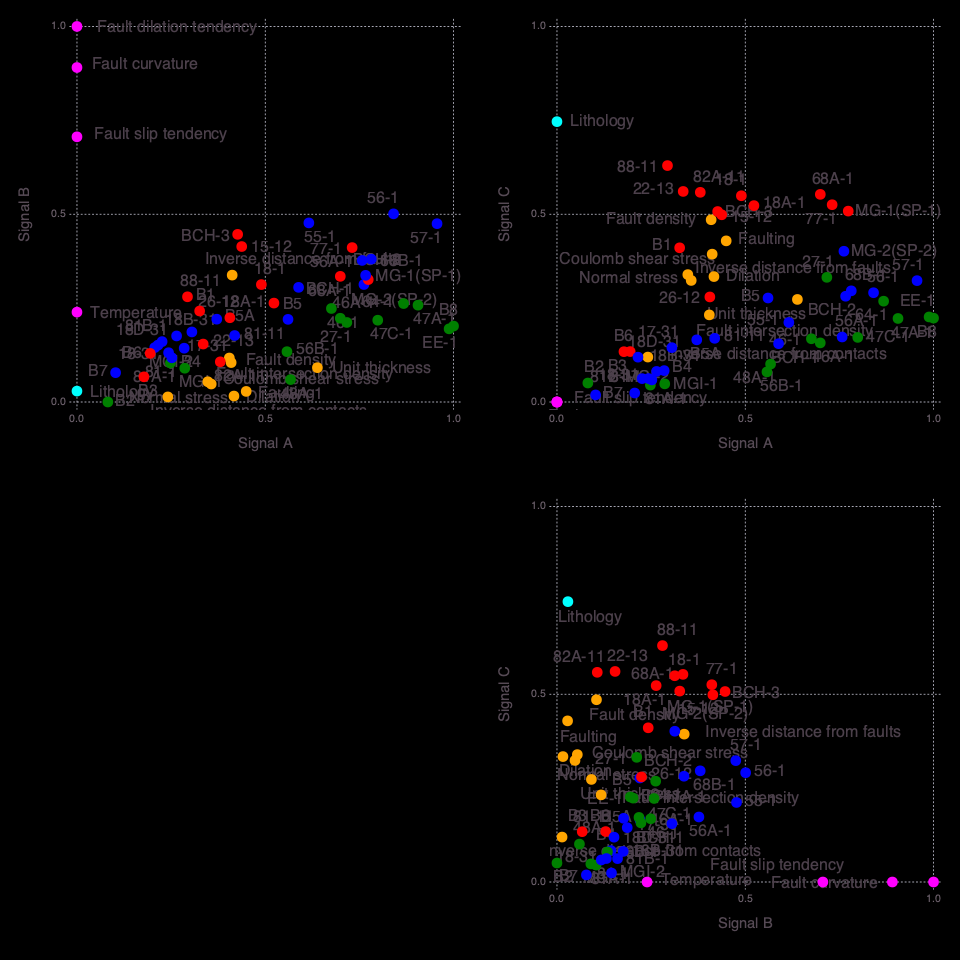

([[2, 1], [3, 2, 1]], [['B', 'B', 'A', 'B', 'A', 'B', 'B', 'A', 'A', 'A'  …  'B', 'A', 'B', 'A', 'B', 'A', 'A', 'A', 'A', 'B'], ['C', 'B', 'C', 'B', 'C', 'B', 'B', 'C', 'C', 'A'  …  'B', 'A', 'B', 'B', 'C', 'A', 'C', 'B', 'A', 'B']], [['A', 'A', 'A', 'A', 'B', 'B', 'B', 'B', 'A', 'A', 'A', 'A', 'A', 'A'], ['A', 'A', 'A', 'A', 'B', 'B', 'B', 'B', 'A', 'A', 'A', 'A', 'A', 'C']])

In [69]:
NMFk.clusterresults(NMFk.getks(nkrange, robustness[nkrange]), W, H, locations, attributes_process_long; loadassignements=true, lon=xcoord, lat=ycoord, Wsize=depth, Wcasefilename="locations", Hcasefilename="attributes", resultdir=resultdir * "-$(nruns)-dlan", figuredir=figuredir * "-$(nruns)-dlan", hover="Well: " .* locations .* "<br>" .* "WellType: " .* String.(welltype) .* "<br>" .* production, Wmatrix_font_size=4Gadfly.pt, biplotcolor=:WH, biplotlabel=:WH)